In [1]:
!pip install git+https://github.com/huggingface/transformers.git@main

  Cloning https://github.com/huggingface/transformers.git (to revision main) to /tmp/pip-req-build-vp6iooog
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/transformers.git /tmp/pip-req-build-vp6iooog
  Resolved https://github.com/huggingface/transformers.git to commit 2c658b5a4282f2e824b4e23dc3bcda7ef27d5827
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for transformers: filename=transformers-4.36.0.dev0-py3-none-any.whl size=8119970 sha256=00276841bbeb398c0a1927e439567f8101bf3d6e11109be00825449e4cd0414f
  Stored in directory: /tmp/pip-ephem-wheel-cache-frdfh38n/wheels/cf/59/82/6492402e887a68975030bf8c06532260abc16abb7ccd8127cc
Successfully built transformers
  Attempting uninstall: transformers
    Found existing installation: transformers 4.35.2
    Uninstalling transformers-4.35.2:
      Successfully uninstalled transformers-4.35.2


In [2]:
!pip install -q datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 521.2/521.2 kB 9.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 14.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 17.5 MB/s eta 0:00:00


In [ ]:
from datasets import load_dataset

from google.colab import drive
drive.mount('/content/drive')

!ls -l /content/drive/MyDrive/mini_danny_dataset/train

epoch = 9
# path for the model
save_path = "/content/drive/MyDrive/CSC490/CSC490 Project/fine_tuned_model" + str(epoch) + ".pth"
print(save_path)

Mounted at /content/drive
ls: cannot access '/content/drive/MyDrive/mini_danny_dataset/train': No such file or directory
/content/drive/MyDrive/CSC490/CSC490 Project/fine_tuned_model9.pth


In [ ]:
import time

dataset = load_dataset("imagefolder", data_dir="/content/drive/MyDrive/CSC490/CSC490_MONDAY_PREP/train", split="train")

print(dataset[0])

Resolving data files:   0%|          | 0/3649 [00:00<?, ?it/s]

Extracting data files: 0it [00:00, ?it/s]

Generating train split: 0 examples [00:00, ? examples/s]

{'image': <PIL.PngImagePlugin.PngImageFile image mode=RGB size=472x474 at 0x7F9FD19935E0>, 'pdf_hash': '0004c38bb0b10c16d7373a6f6f217ec786f5f6bf', 'fig_uri': '2-Figure1-1.png', 'text': 'The chest Xray showed a curved tubular structure in the right middle lung field arrows An anomalous segmental pulmonary vein was later identified arrowheads'}


In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader

class ImageCaptioningDataset(Dataset):
    def __init__(self, dataset, processor):
        self.dataset = dataset
        self.processor = processor

    def __len__(self):
        return len(self.dataset)

    def __getitem__(self, idx):
        item = self.dataset[idx]
        encoding = self.processor(images=item["image"], text=item["text"], padding="max_length", return_tensors="pt")
        # print(encoding["pixel_values"].shape)
        # remove batch dimension
        encoding["input_ids"] = encoding["input_ids"][:, :512]  # Truncate if longer
        encoding["attention_mask"] = encoding["attention_mask"][:, :512]
        encoding = {k:v.squeeze() for k,v in encoding.items()}


        return encoding

In [ ]:
from transformers import AutoProcessor, BlipForConditionalGeneration

processor = AutoProcessor.from_pretrained("Salesforce/blip-image-captioning-base")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")

epoch_not = 0
save_path = "/content/drive/MyDrive/CSC490_MONDAY_PREP/fine_tuned_model" + str(epoch_not) + ".pth"
torch.save(model.state_dict(), save_path)

In [ ]:
train_dataset = ImageCaptioningDataset(dataset, processor)
train_dataloader = DataLoader(train_dataset, shuffle=True, batch_size=6, drop_last=True)

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

def generate_caption(image_index, data):
  example = data[image_index]
  image = example["image"]
  width, height = image.size
  display(image.resize((int(0.3*width), int(0.3*height))))

  inputs = processor(images=image, return_tensors="pt").to(device)
  pixel_values = inputs.pixel_values

  generated_ids = model.generate(pixel_values=pixel_values, max_length=50)
  generated_caption = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]

  result = []
  result.append(generated_caption)
  result.append(data[image_index]["text"])
  print(generated_caption)
  print(data[image_index]["text"])
  return result


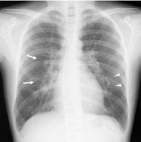

followup chest radiograph showing a mass in the right upper lobe with an irregular margin and a small amount of peribronchial enhancement arrows
The chest Xray showed a curved tubular structure in the right middle lung field arrows An anomalous segmental pulmonary vein was later identified arrowheads


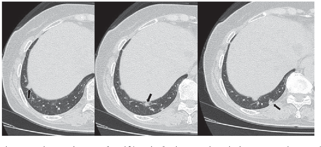

axial chest computed tomography images showing a mass in the right lower lobe with a masslike appearance in the right lower lobe arrow and a masslike appearance in the right lower lobe with a masslike appearance in the right lower lobe with a masslike
Follow‑up chest computed tomography scan performed 24 months after the surgery detected pulmonary metastatic tumors ≤15 mm in the right


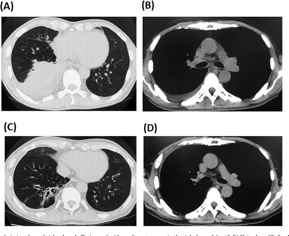

a and c standard dose images b and d low dose images d and d low dose images d and d low dose images d and d low dose images d and d images d images d images d images d images d images d images d images d
Plain chest CT on admission showed right pleural effusion and a 10cm diameter mass in the right lower lobe   Plain chest CT after hormonal treatment showed development of pleural effusion and pseudotumor


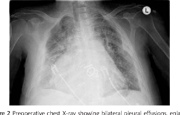

preoperative chest xray showing bilateral pleural effusions enlargement of the right lung and left pleural effusion
Preoperative chest Xray showing bilateral pleural effusions enlargement of the heart the Starr–Edwards ballcage valve in mitral position and a mechanical prosthesis in aortic position


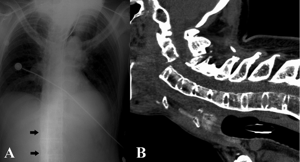

chest radiograph and computed tomography of the chest showing a large mass in the right upper lobe with a small amount of calcification in the right upper lobe arrow and a large mass in the right lower lobe with a small amount of calci
chest radiograph and emergency CT of the cervical spine  Careful review of the initial chest radiograph suggesting a bamboo spine arrows  Emergency CT of the cervical spine showing a fracture with severe displacement at the lower C2 level anterior to the body of the spinous process involving a facet joint fracture and diffuse ankylosis of the cervicothoracic spine


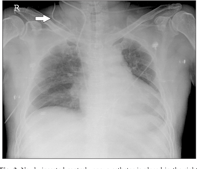

noncontrasted chest radiograph showing a large mass in the right lower lobe with a small amount of pericardial effusion arrow
Newly inserted central venous catheter is placed in the right subclavian vein and superior vena cava in postoperative chest Xray white arrow


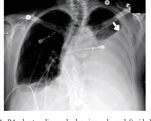

radiological findings of the chest and abdomen
PA chest radiograph showing a large leftsided pleural effusion arrow


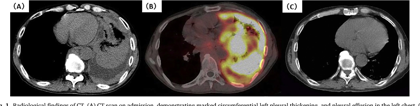

radiological findings of ct scan on admission demonstrating marked perforation of right main pulmonary arteries and pleural effusion in the left chest and the left main pulmonary artery
Radiological findings of CT  CT scan on admission demonstrating marked circumferential left pleural thickening and pleural effusion in the left chest  FDGPET demonstrating intense FDG uptake by the left pleura  CT scan after the chemotherapy demonstrating disappearance of the tumor


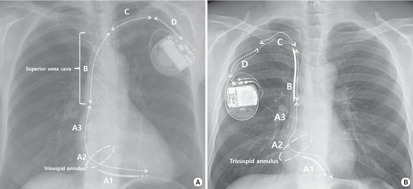

a chest radiograph showing a mass lesion in the right upper lobe b chest radiograph showing a mass lesion in the right upper lobe c chest radiograph showing a mass lesion in the right upper lobe
Location of conductor externalization on chest Xray posterioranterior view  Single coil lead  Dual coil lead   distal to the SVC coil dual coil lead or distal to the SVC single coil lead A1 proximal right ventricular coil to the tricuspid annulus A2 tricuspid annulus A3 tricuspid annulus to the SVC coil dual coil lead or right atrium single coil lead   distal to the clavicle including the SVC coil dual coil lead or SVC area single coil lead   clavicular area   distal clavicle to the generator can SVC  superior vena cava


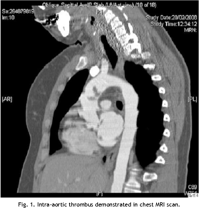

intraaortic thrombus demonstrated in chest mri scan
Intraaortic thrombus demonstrated in chest MRI scan


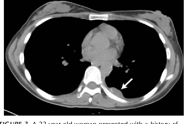

figure 2 22yearold woman presented with a history of chest pain and dyspnoea for a history of a history of a noncontrast enhanced chest ct image shows a large mass with heterogeneous enhancement in the right upper
FIGURE 3  22yearold woman presented with a history of left back pain for about 1month Unenhanced CT scan shows that the tumor had the amorphous calcifications in the posterior left chest wall arrow


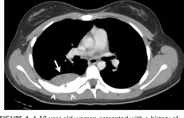

a 40yearold woman presented with a history of chest pain and dyspnoea and a history of a history of a history of a history of a history of a history of a history of a history of a history of a history of
FIGURE 4  19yearold woman presented with a history of right chest pain for about 1month Enhanced CT scan shows that the tumor had mild heterogeneous enhancement in the posterior right chest wall arrow and bony destruction arrowhead


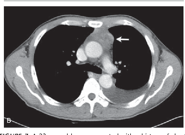

figure 7 22yearold woman with a history of chest pain and chest wall pain and chest wall pain contrastenhanced ct of the chest shows a mass with heterogeneous enhancement in the right upper lobe arrow and a mass with hetero
FIGURE 7  23yearold man presented with a history of chest pain and shortness of breath for about 1month FDGPETCT images  show increased metabolic activity in the anterior middle mediastinal tumor lymph nodes in the right supraclavicular fossa and small bilateral pleural effusions CT scan  shows that the tumor was remission at the 3month followup after chemotherapy arrow


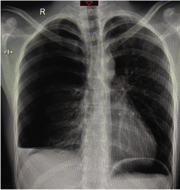

chest xray showing a mass in the right upper lobe
Initial chest xray posterior anterior view showed right apical pneumothorax with air fluid level and a collapsed lung


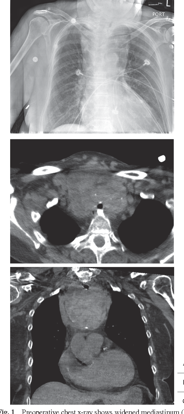

preoperative chest xray shows marked mediastinal shift and mediastinal shift preoperative ct shows marked mediastinal shift and mediastinal shift
Preoperative chest xray shows widened mediastinum  Preoperative CT scan shows narrowed trachea  and large substernal goiter


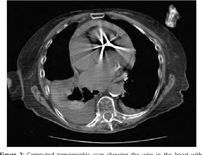

computed tomography scan showing the welldefined heart with contrast enhancement in the right atrium and the right atrium with a small amount of calcification in the right atrium
Scout view showing one wire within the heart shadow another in the left upper chest and the third still in place in the dislocated left shoulder  Computed tomographic scan showing the wire in the heart with pericardial effusion Under cardiopulmonary bypass we extirpated the foreign body and repaired a tear in the inferior vena cava


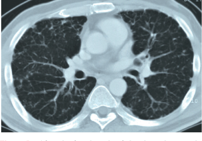

highresolution computed tomography of the chest showing a mass lesion in the right upper lobe with a mass measuring 7 cm in diameter
After the fourth cycle of the chemotherapy the thickness of bronchovascular bundles lessened and most of the pulmonary nodules had disappeared on chest CT scan


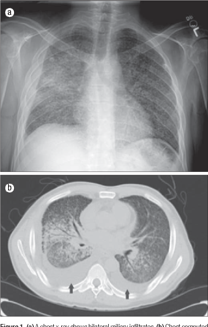

chest xray shows bilateral pulmonary infiltrates chest computed tomography shows bilateral pulmonary infiltrates with groundglass opacities and groundglass opacities arrows
a  chest xray shows bilateral miliary infiltrates b Chest computed tomography scan without contrast shows bilateral miliary infiltrates and bilateral pleural effusions arrows


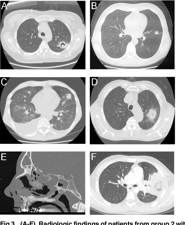

ab radiologic findings of patients from group 2 with a primary lung cancer and a primary lung cancer ab axial chest ct image shows a mass in the right lower lobe with a mass in the right lower lobe with a mass in the right lower lobe with
AF Radiologic findings of patients from group 2 with possible IFD – and proven IM  and   Patient 16 Well shaped nodular lesion of 45 cm with surrounding area of ground glass and air crescent sign in the posterior part of the upper left pulmonary lobe at HRCT  Patient 17 Pulmonary HRCT demonstrating a small well shaped nodular lesion of the left upper lobe  Patient 18 Pulmonary HRCT showing multiple bilateral well shaped nodular lesions sometimes surrounded by groundglass attenuation Bilateral pleural effusions  Patient 19 HRCT showing a large 47 cm nodular lesion surrounded by an area of ground glass attenuation in the posterior part of the upper left pulmonary lobe  Patient 20 Sagittal sinus CT scan Soft tissue obliteration of ethmoid and middle meat

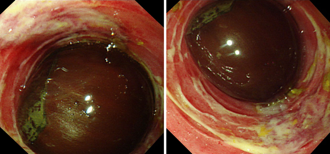

bronchoscopic view of the bronchoscopic view of the bronchoscopic view of the bronchoscope showing the bronchoscopic view of the bronchoscope showing the bronchoscopic view of the bronch
Small intestinal endoscopy on the next day of hospitalization revealed that the foreign body was a chestnut and that the intestinal mucosa was edematous with ulceration


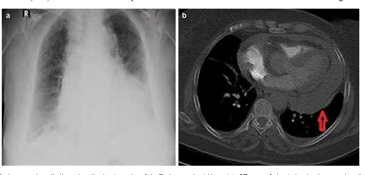

a chest radiograph showing a mass lesion in the right upper lobe b computed tomography of the chest showing a mass lesion in the right upper lobe arrow and a ct scan of the chest showing a mass lesion in the right upper lobe
FIG 1 a b Increased cardiothoracic ratio due to pericardial effusion on chest Xray a CT scan of chest showing large pericardial effusion see arrow b


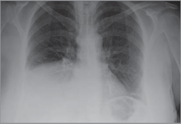

posteroanterior chest radiograph showing bilateral pleural effusions and bilateral pleural effusion
The opacification of the lower part of the right hemithorax due to a well defined huge mass on chest radiography


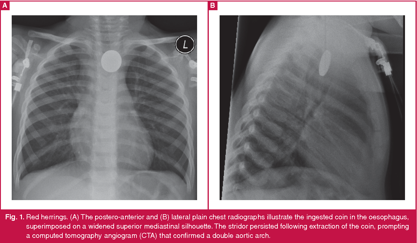

radiographic findings the patient presented with a unilateral chest radiograph the patient presented with a partial response to the operation with the degenerative reconstruction of the chest radiograph the patient presented with a partial response to the operation with the radio
Red herrings  The posteroanterior and  lateral plain chest radiographs illustrate the ingested coin in the oesophagus superimposed on a widened superior mediastinal silhouette The stridor persisted following extraction of the coin prompting a computed tomography angiogram CTA that confirmed a double aortic arch


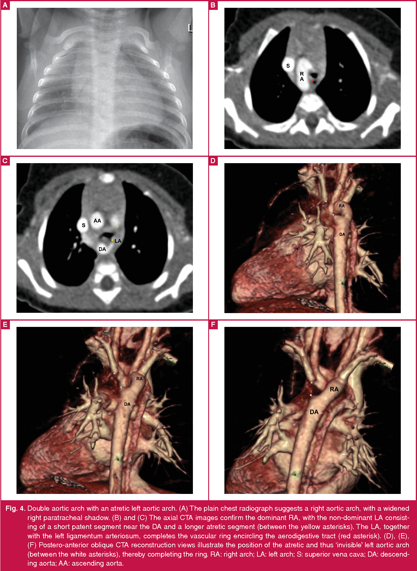

double aortic arch and a left lateral chest wall mass with an abnormally located aortic arch and a right lateral chest wall mass with an obstructed right hilar and subclavian artery and a right lateral chest wall mass
Double aortic arch with an atretic left aortic arch  The plain chest radiograph suggests a right aortic arch with a widened right paratracheal shadow  and  The axial CTA images confirm the dominant RA with the nondominant LA consisting of a short patent segment near the DA and a longer atretic segment between the yellow asterisks The LA together with the left ligamentum arteriosum completes the vascular ring encircling the aerodigestive tract red asterisk    Posteroanterior oblique CTA reconstruction views illustrate the position of the atretic and thus ‘invisible’ left aortic arch between the white asterisks thereby completing the ring RA right arch LA left arch  superior vena cava DA descending aorta AA ascending aorta


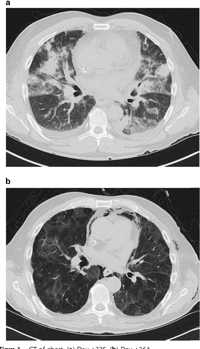

ct of chest a day 3 b day 14 c day 15 d day 17 d day 17 d day 17
CT of chest a Day 325 b Day 364


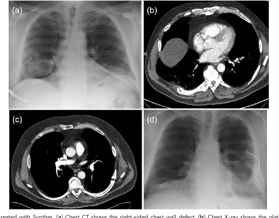

a chest xray showed a mass with contrast in chest ct shows the rightsided chest wall defect b chest xray shows the mass with contrast in the right upper lobe of the right lung c chest ct shows the mass with contrast in the right upper
Lung herniation treated with Synthes a Chest CT shows the rightsided chest wall defect b Chest Xray shows the plate in the correct place postoperatively Rib malunion c Chest CT shows the defect of the chest wall d Postoperative chest Xray shows the application of the clips and bar to stabilize the rib no chest wall defect and good lung reexpansion


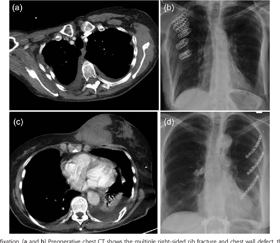

a and b preoperative chest ct shows the multiple rightsided right sided rib fracture and chest wall defect with a small amount of pleural effusion c and d preoperative chest ct shows a small amount of pleural e
Chest trauma rib fixation a and b Preoperative chest CT shows the multiple rightsided rib fracture and chest wall defect the postoperative chest Xray shows the correction of the chest shape with no pleural effusion with Stratos system c and d Preoperative chest CT shows the multiple leftsided rib fracture and chest wall defect the postoperative chest Xray shows the correction of the chest shape with no pleural effusion with Synthes system


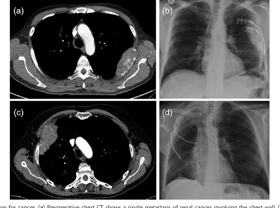

a chest xray and b contrastenhanced ct scan of the chest showing a mass in the right upper lobe with a mass in the right upper lobe with a mass located in the right lower lobe with a mass located in the right upper lobe
Chest wall resection for cancer a Preoperative chest CT shows a single metastasis of renal cancer involving the chest wall b Postoperative chest Xray shows the Stratos device in place c Preoperative chest CT shows a nonsmallcell lung cancer invading the chest wall pT3N0 d Postoperative chest Xray shows good lung reexpansion after upper lobectomy and correction of the chest wall defect


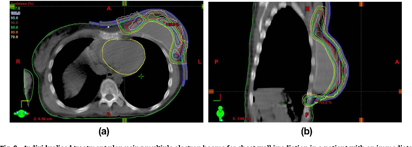

axial and coronal images from a noncontrast computed tomography of the chest with a circumferential mass in the right atrium and left atrium showing a mass with a circumferential mass in the right atrium and the
– Individualised treatment plan using multiple electron beams for chest wall irradiation in a patient with an immediate breast reconstruction with an implant a axial slice b sagittal slice


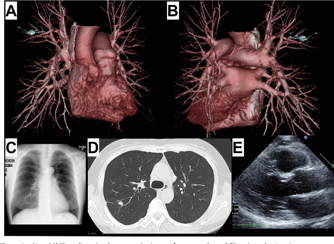

preoperative chest xray and computed tomography ct scan showing a mass lesion in the right upper lobe with a mass lesion in the right upper lobe and a mass lesion in the right lower lobe with a mass lesion in the
and  Three dimensional reconstraction image of contrastenhanced CT angiography Anterior  Posterior    chest Xray at admission  Coin lesion in CT scans  Echocardiography


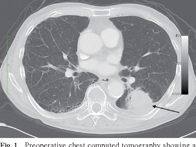

preoperative chest computed tomography showing a mass in the right upper lobe with a small amount of calcification arrow
Preoperative chest computed tomography showing a tumor measuring 35 mm in diameter in the left lower lobe arrowed


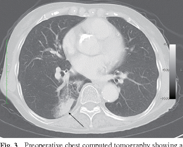

preoperative chest computed tomography showing a mass in the right upper lobe with a small amount of calcification in the right upper lobe arrow
Preoperative chest computed tomography showing a tumor involving the chest wall measuring 7 cm in diameter in the right upper lobe arrowed


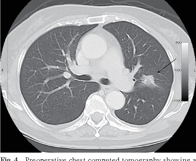

preoperative chest computed tomography showing a mass in the right upper lobe with a small amount of calcification in the right upper lobe arrow
Preoperative chest computed tomography showing a tumor with spiculation measuring 20 mm in diameter near the pulmonary artery across the upper and lingular segments in the left upper lobe arrowed


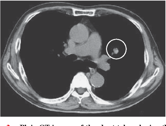

the chest ct image shows a mass in the right hilum with a circle in the right hilum the mass is located in the right hilum and the right hilum
Plain CT images of the chest taken during the patient’s first visit There is a 10×10 mm nodule in the left hilar node indicated by a white circle


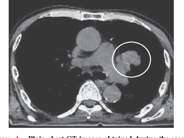

plain chest ct images obtained during the second admission the mass is located in the right hilum and the mass is located in the right hilum and the mass is located in the right hilum
Plain chest CT images obtained during the second admission The nodule seen at the lung hilar site at the initial diagnosis had grown in size to 36×27 mm indicated by a white circle


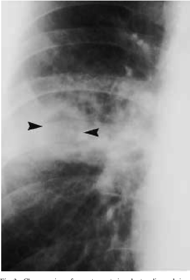

the posteroanterior view of a posteroanterior chest radiograph showing a large mass in the right upper lobe with an irregular margin and a small amount of pleural effusion arrows the mass is surrounded by a thick
–Closeup view of a posteroanterior chest radiograph in a 43yrold alcoholic male with acute cavitating pneumonia by Staphylococcus aureus  poorly defined area of airspace consolidation containing a rounded radiolucency arrowheads is depicted in the right upper lung


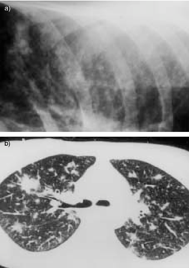

a posteroanterior chest radiograph showing bilateral nodular opacities b highresolution computed tomography of the chest showing bilateral groundglass opacities and bilateral nodular opacities
– Adenovirus pneumonia in a 28yrold female a Closeup view of a posteroanterior chest radiography demonstrates poorly defined nodular opacities b Corresponding highresolution computed tomography scan shows multiple poorly defined bilateral nodular opacities in a predominantly peribronchial distribution


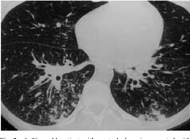

computed tomography of the chest showing bilateral groundglass opacities and groundglass opacities
–  28yrold patient with acute leukaemia presented with fever and a normal chest radiograph Highresolution computed tomography scan demonstrates thickening of the bronchial and bronchiolar walls and multiple bilateral illdefined nodular opacities with a treeinbud appearance The final diagnosis was Aspergillus bronchiolitis


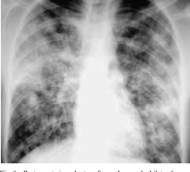

posteroanterior chest radiograph showing bilateral pleural effusions and bilateral pleural effusion
– Posteroanterior chest radiograph reveals bilateral nonsegmental consolidations in the lingula and in the right upper and lower lobes Aspergillus fumigatus was recovered from the sputum


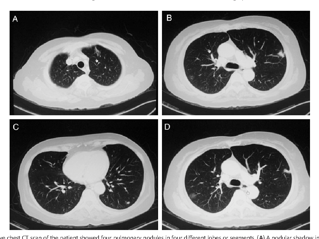

axial chest ct scans of the patient showed four pulmonary nodules in four different lobes of segments a nodule was observed in the right lower lobe and b multiple nodules were observed in the right lower lobe and c and d
Preoperative chest CT scan of the patient showed four pulmonary nodules in four different lobes or segments   nodular shadow in the left S3 segment  a nodular shadow in the left S4 segment  a nodular shadow in the left lower lobe and  a GGO in the right upper lobe


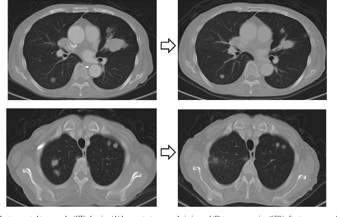

the chest ct scans show a mass in the right upper lobe with a masslike appearance in the right lower lobe the mass was larger than the mass in the left lower lobe the mass was larger than the mass in the left lower lobe the mass was
Serial chest computed tomography CT showing  lung metastases on admission and b tumor regression 65 after two courses of chemotherapy


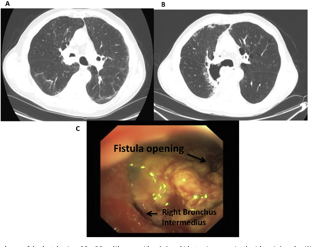

a and b computed tomography of the chest showing a mass in the right bronchus arrow b and d bronchoscopic findings of the bronchial wall thickening of the bronchial wall bronchial wall thickening of the
Computed tomography scan of the chest showing a 32 33 cm hilar mass with endobronchial extension narrowing the right main bronchus  Computed tomography scan of the chest showing a thick walled cavity in the right upper lobe with tracheoparenchymal fistula just above the right upper lobe bronchus  Bronchoscopy revealed a tracheoparenchymal fistula connecting the right main bronchus to a large cavity in the right upper lobe destroying majority of the right main bronchus and causing significant attenuation of the bronchus intermedius


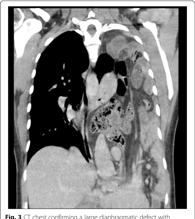

ct chest confirming a large diaphragmatic defect with a large heterogeneous mass in the right upper lobe with a heterogeneous enhancement and a heterogeneous enhancement in the right upper lobe
CT chest confirming a large diaphragmatic defect with herniation of stomach small and large bowel and spleen into the chest cavity and almost complete collapse of the left lung


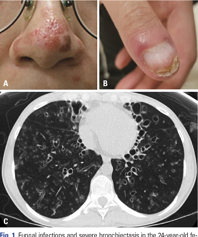

fungal infections and severe bronchiectasis in the 24yearold female patient with a primary fingernail and a fingernail with a foreign body a bronchiectasis with a fingernail and a fingernail b bronchiectasis
Fungal infections and severe bronchiectasis in the 24yearold female patient  Cutaneous candidiasis of nasal skin  Onychomycosis of a fingernail  Bilateral bronchiectasis and bronchiolitis on chest computed tomography scan


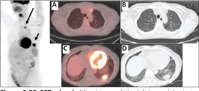

3d petct and fdg petct and fdg petct show a mass in the right lower lobe of the right lower lobe with a maximum intensity of the fdg petct show a mass with a maximum intensity of the f
3D PET abcd After biopsy of the left lower lobe lesion revealed NHL the initial staging PETCT shows the increased FDG uptake associated with these pulmonary opacities in the left upper medial chest large arrow and in the left lower lateral chest small arrow on the 3D PET image The fused axial image  and axial CT slice on lung window  demonstrate the increased FDG uptake associated with the opacity in the left upper lobe with SUV max of 52 which correlating the upper medial FDG uptake on 3D PET image The fused axial image  and axial CT slice  show the FDG avid parenchymal lesion in the left lower lobe measuring 29x22 cm with SUV max of 102 correlating to the lower lateral FDG uptake on 3D PET image No other site of abnormal increased FDG uptake is noted on the rest of the whole body PET images to suggest 

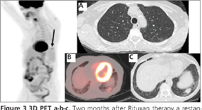

3d pet abc two months after rituxan therapy a restaging petct scan shows a large mass in the right upper lobe with a maximum intensity of the mass arrow and a small nodule in the right upper lobe with a maximum intensity of
3D PET abc Two months after Rituxan therapy a restaging PETCT shows a faint focus of abnormal increased FDG uptake in the left lower lateral chest arrow and complete resolution of the FDG uptake in the upper medial chest on the 3D PET image On the axial CT image  the upper lobe lesion has completely resolved The fused axial image  and axial CT slice  show interval decrease in the size and FDG uptake of the lower lobe lesion to 24x17 cm with SUV max of 24 representing favorable response to treatment


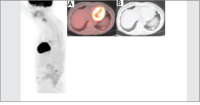

figure 1 a positron emission tomographycomputed tomographycomputed tomographycomputed tomographycomputed tomographycomputed tomographycomputed tomographycomputed tomographycomputed tomographycomputed tomographycomputed tomography
3D PET ab Six months after completion of therapy 3D PET image shows interval near complete resolution of FDG uptake in the left lower lateral chest The fused axial image  and axial CT slice  demonstrate decrease in the size of left lower lobe lesion which has only subtle increased FDG uptake the lesion at this time measured 24x14 cm with SUV max of 17 representing continued favorable response to treatment


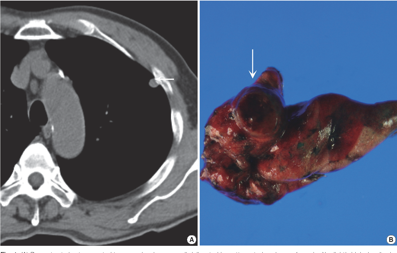

chest computed tomography showing a mass in the right upper lobe with a masslike appearance in the right lower lobe arrow and a mass in the right lower lobe with a masslike appearance in the right upper lobe with a mass arrow
Precontrast chest computed tomography shows a welldelineated lowattenuated oval mass arrow with slightly high density delete the portion in the subpleural area  Gross photo shows a welldemarcated ovoid mass arrow with a mucous gelatinous texture with focal hemorrhage


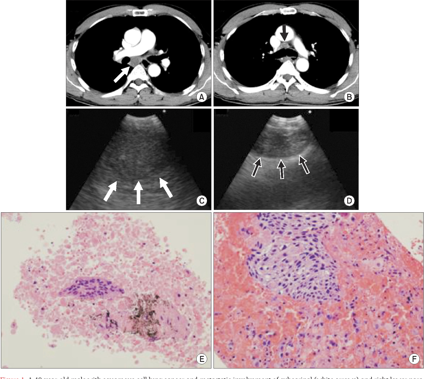

a and c and d chest computed tomography ct images of a thymoma of the right lung with a mass arrow and a large mass arrow in the right lower lobe with a mass arrow and a mass arrow in the right lower lobe with a
48yearold male with squamous cell lung cancer and metastatic involvement of subcarinal white arrows and right lower paratracheal black arrows lymph nodes   Initial chest computed tomography scan shows subcarinal and right lower paratracheal lymph node enlargement   An endobronchial ultrasound image of the subcarinal and right lower paratracheal lymph nodes shows hypoechoic texture a round shape and welldemarcated borders   The tumor cells formed sheets of hyperchromatic cells with a high nuclearcytoplasmic ratio and focal keratinization The specimen has a necrotic and hemorrhagic background HE stain ×400


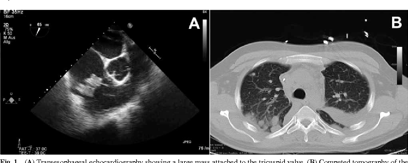

transesophageal echocardiography showing a large mass attached to the tricuspid valve computed tomography of the chest showing a mass with a thick margin and thickened wall with a thick wall thick wall thick wall thick wall thick wall
Transesophageal echocardiography showing a large mass attached to the tricuspid valve  Computed tomography of the chest showing bilateral nodular lesions with cavitation


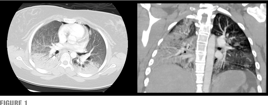

figure 1 computed tomography of the chest showing a mass in the right upper lobe with a masslike appearance in the right upper lobe and a mass in the right lower lobe with a masslike appearance in the right upper lobe
FIGURE 1 Admission chest computed tomography scan demonstrating right lower lobe consolidation and diffuse infiltrates


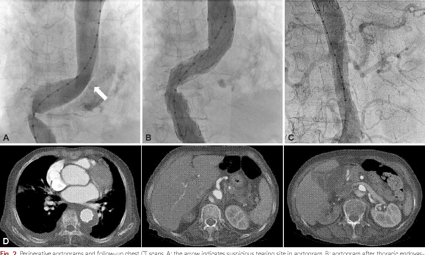

pericardial aortic followup followup chest ct scan a large mass in the right lower lobe was observed in the right lower lobe arrow and the mass was located in the right lower lobe of the right lung b the mass was located in
Periperative aortograms and followup chest CT scans  the arrow indicates suspicious tearing site in aortogram  aortogram after thoracic endovascular aortic repair Stent graft was positioned from distal thoracic aorta to just above celiac axis  restoration of blood flow in the abdominal branches after stent grafting  the postoperative CT scan shows that the size of true lumen in descending aorta have been increased and false lumen successfully have been obliterating


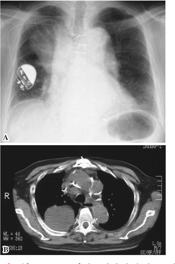

chest radiograph showing a mass in the right upper lobe with a mass in the right lower lobe and a ct scan of the chest showing a mass with a mass in the right upper lobe
After one year of pleurodesis both chest radio graph 3A and CT 3B revealed a marked increase in the size of the pulmonary tumor However no increase in pleural efusion was observed


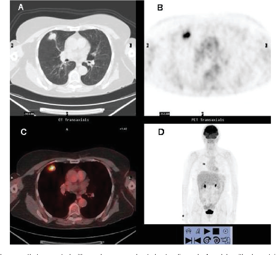

a and c positron emission tomographycomputed tomographycomputed tomographycomputed tomographycomputed tomographycomputed tomographycomputed tomographycomputed tomographycomputed tomographycomputed tomographycomputed tomography
68 yearold woman that presented with a pulmonary node at chest radiograph  nodule with pleura tail and increased 18FDG uptake is observed in the right upper lobe at 18FDG PETCT scan The histologic study demonstrated tuberculoma


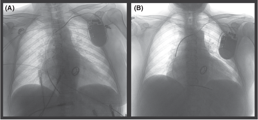

left panel lateral chest xray showing a large left ventricle with a large right ventricle and a large right ventricle with a large right ventricle with a large right ventricle with a large right ventricle with
The panel  shows the chest Xray in the emergency department The ventricular lead is dislodged into the right atrium The panel  corresponds to the routine Xray after repositioning the ICD lead


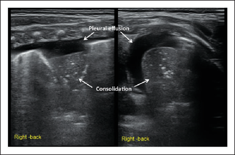

right hilar area with a large area of consolidation in the right hilar area with a large area of consolidation in the right hilar area with a large area of consolidation in the right hilar area with a large area of consolidation in the right
Lung ultrasonographic findings in a newborn with neonatal meconium aspiration syndrome This patient’s lung ultrasonography showed large areas of pulmonary consolidation with air bronchogram and clear edges in the right lung that were consistent with atelectasis The pleural line blurred or disappeared and the Aline disappeared Apparent hyperechoic fluidfilled areas were present in the chest suggesting pleural effusion left the hand piece was perpendicular to the ribs right the hand piece was parallel to the ribs


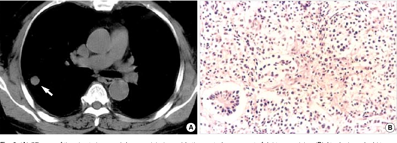

the chest ct scan showed a masslike mass in the right upper lobe with a small amount of calcification in the right upper lobe arrow the mass was surrounded by a masslike mass with a masslike masslike mass arrow the mass was surrounded
CT scan of the chest shows a 14 cm nodule arrow in the posterior segment of right upper lobe  Atypical carcinoid tumor with mosaic patterns separated by thin fibrovascular stroma The tumor cells have central round nuclei with abundant cytoplasm HE ×100


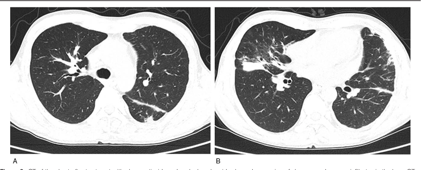

the chest ct scan showed a mass lesion in the right upper lobe with a masslike appearance in the right upper lobe the mass was approximately 25 cm in diameter and the mass was surrounded by a mass in the right upper lobe with a mass les
CT of the chest after treatment with glucocorticoids and cyclophospha computed tomography


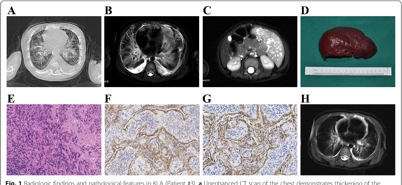

a and c a and d endobronchial and pathological images of the patient with a pulmonary mass in the right lower lobe and a and b and d endobronchial mass in the right lower lobe and d and d and
Radiologic findings and pathological features in KLA Patient 3 a Unenhanced CT scan of the chest demonstrates thickening of the interlobular septa Axial T2weighted thoracic MRI shows pericardial effusion and highsignal abnormality in the mediastinum that extends along the bronchovascular bundles b Axial T2weighted MRI of the abdomen shows multiple highsignal splenic lesions c Macroscopic view of the spleen excised from the patient d Multiple small reddish blue nodules are noted on the surface of the spleen Hematoxylineosin staining shows dilated lymphatic channels and dispersed small irregular cellular clusters within the splenic parenchyma The clusters are comprised of spindlelike cells without distinct lumens e The spindlelike cells are immunopositive for CD31  and D2–40 g 6 months after splenec

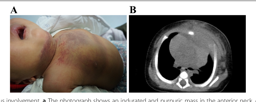

a preoperative chest computed tomography shows a the photograph shows an enlarged and purpuric mass in the anterior neck and the right upper lobe of the right lung b preoperative chest computed tomography shows a large mass with a het
KHE with cutaneous involvement a The photograph shows an indurated and purpuric mass in the anterior neck chest and abdominal wall Patient 13 Ecchymosis was evident with telangiectasia b An unenhanced CT scan revealed an extensive softtissue mass with illdefined margins throughout the anterior thoracic musculature


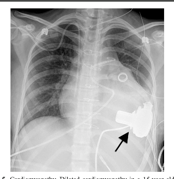

cardiomyopathy dilated cardiomyopathy in a 15yearold girl with a history of heart failure and chest pain cardiomegaly and cardiomegaly were treated with a chest tube and a tube and a tube in the right
Cardiomyopathy Dilated cardiomyopathy in a 15yearold girl with history of acute myeloid leukemia and treatment with anthracycline Anteroposterior radiograph of the chest demonstrates moderate to marked cardiomegaly  left ventricular assist device arrow has been placed to treat the cardiac dysfunction  mediastinal pigtail drainage catheter right central venous line and nasogastric tubes are seen


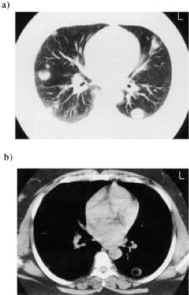

a computed tomography of the chest showing a mass in the right upper lobe b a ct scan of the chest showing a mass in the right upper lobe with a mass in the right upper lobe with a mass in the right upper lobe with a mass
– Highresolution computed tomography of the chest showing multiple cavitary nodules a lung window b bone window


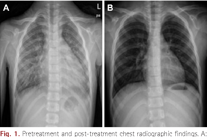

pretreatment and posttreatment chest radiographic findings findings of the patient with a primary pulmonary artery bypass and a right ventricle
Pretreatment and posttreatment chest radiographic findings  bronchopneumonia scanty parapneumonic effusion and cardiomegaly CT ratio 066 was observed HD3  there was no abnormal finding after treatment including heart size HD13 HD hospital day


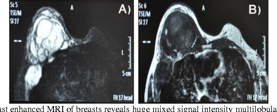

contrastenhanced mri of the chest reveals a huge mixed signal intensity multiloculated mass with a maximum intensity of volume of 40 hounsfield units hu in the right breast and left breast mass with a maximum intensity of hounsfield units
Contrast enhanced MRI of breasts reveals huge mixed signal intensity multilobulated cysticsolid extrapulmonary mass lesion involving the right anterior chest wall appearing predominantly hyperintense on T2W and hypointense on T1W Heterogeneous predominantly peripheral solid tumoral enhancement is observed with multiple large loculated central areas of necrosis and intensely enhancing septae


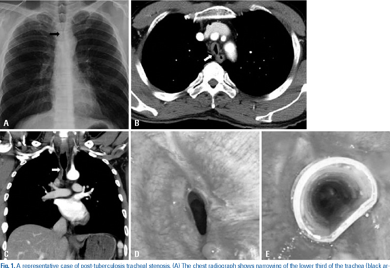

representative images of and without a tumor in the chest radiograph showing a mass of the lower third of the trachea black arrow and a mass of the trachea white arrow and a mass of the trachea white arrow and a mass
representative case of posttuberculosis tracheal stenosis  The chest radiograph shows narrowing of the lower third of the trachea black arrow  and  Computed tomography revealed tracheal stenosis white arrow at the level of the T3 vertebra Tracheal wall thickening 51 mm was found at the stenotic lesion  and   rigid bronchoscopy was performed to reverse airway patency The lower trachea was 5×10 mm narrowed by a fibrous stricture After bougienation a silicone stent was inserted outer diameter 14 mm inner diameter 12 mm length 40 mm


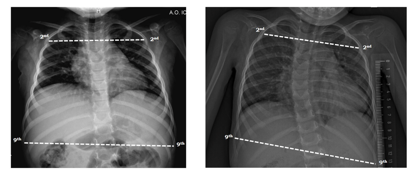

the chest xrays show the measurement of the right hemidiaphragm and the right hemidiaphragm the measurement of the right hemidiaphragm was performed to measure the right hemidiaphragm the measurement of the
FIGURE 2  Measurement of the ratio of upper to lower ribcage on anteroposterior view of chest radiograph in a SMA type 2 child with mild left and severe right scoliosis in supine position The lines were drawn from the inner margin of the ribs 2 and 9 on one side to the other side


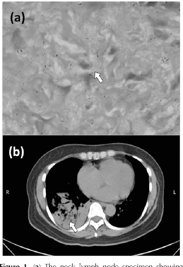

a the neck lymph node specimen showing a large mass with a low density in the right upper lobe b the chest ct scan showing a mass with a high density in the right upper lobe with a low density in the right upper lobe with a
a The neck lymph node specimen showing the presence of tuberculosis white arrow b The computed tomography scan of the chest revealed multiple illdefined foci patchy opacities on the left upper lobe and illdefined patchy consolidated opacities on the right lower lobe white arrow


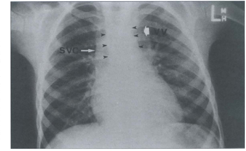

plain radiograph of the chest showing a large mass with a calcified margin in the right upper lobe arrows and a small amount of pericardial effusion in the right upper lobe arrows
Plain chest xray from a 4yearold child with transposition of the great arteries


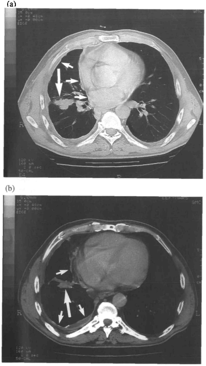

a ct scan of the chest showing a mass in the right upper lobe with a mass arrow and a mass in the right upper lobe with a mass arrow b ct scan of the chest showing a mass with a mass in the right upper lobe with a
Figure  CT scan image of the chest of a typical right sided mesothelioma in the pulmonary window setting a and mediastinal window setting b The pleural localizations surrounding the tumour are indicated with small arrows and the tumour manifestation in the interlobium with the large arrow


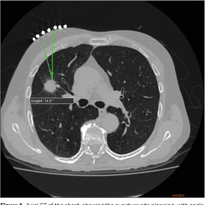

axial ct of the chest showing the puncture site closure with a small amount of pleural effusion measuring 3 × 3 cm
Axial CT of the chest showing the puncture site planning with angle calculation and marking of the skin between the radiopaque markers arrow


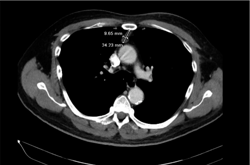

computed tomography of the chest showing a mass measuring 27 × 23 cm in the right upper lobe
CT chest with contrast showing the anterior mediastinal mass


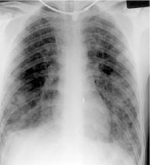

posteroanterior chest radiograph showing a mass in the right upper lobe with a small amount of calcification in the right upper lobe
40 year old man presenting with dyspnoea asthma and eosinophilia The chest radiograph demonstrates predominantly peripheral diVuse alveolar opacities confirmed to be eosinophilic infiltrates


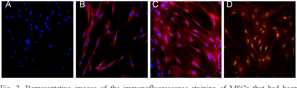

representative images of the immunosuppressive staining of ms6 that had been observed in the right lower lobe and the right lower lobe were obtained by the imaging department of the same patient the blue light is seen in the right upper lobe and
Representative images of the immunofluorescence staining of MSCs that had been induced to dopaminergic differentiation for 0 5 7 and 10 days  – MSCs stained on day 0 for TH displaying only the nuclear label Hochest33258 blue  – The expression of Nestin Cy3 red on day 5  – The expression of TH Cy3 red on day 7  –  merged image from three staining images of MSCs that had been induced for 10 days and then stained for dopamine transporter DAT in the cytoplasm Cy3 red NeuN in the nucleus FITC green and Hochest33258 for nucleus blue


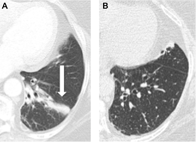

highresolution computed tomography of the chest showing a mass in the right upper lobe with a masslike appearance arrow and a mass measuring 7 × 8 cm in diameter with a maximum diameter of 5 cm in the right upper lobe arrow
Highresolution computed tomography CT scan showing left basal atelectasisbronchiectasis The patient complained of acute onset of bilateral nonpleuritic lower chest pain  Followup CT showing with resolution of symptoms


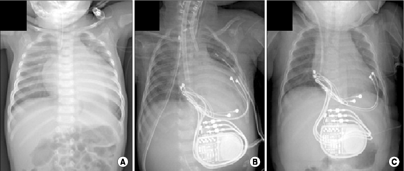

chest xrays showing the presence of a large amount of pericardial effusion in the right lower lobe and right lower lobe with a large amount of pericardial effusion the right lower lobe was not clear the pericardial
Serial chest radiography showed the improvement of cardiomegaly  At admission  One day after cardiac resynchronization therapy during extracorporeal membrane oxygenation  At 5 months of followup


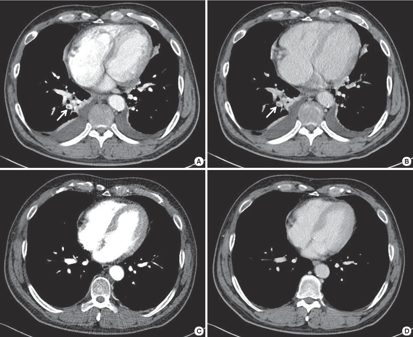

axial and coronal images of the chest showing a mass in the right lower lobe of the lung with a mass in the right upper lobe arrow and a mass in the right lower lobe of the lung with a mass in the right lower lobe of the
Contrastenhanced chest CT images   Images at diagnosis showed pulmonary thromboembolism arrows that involved right lower lobe base segmental pulmonary artery   Followup chest CT scans at 6 months after coumadization showed much regressed pulmonary embolism   Arterial phase   Venous phase


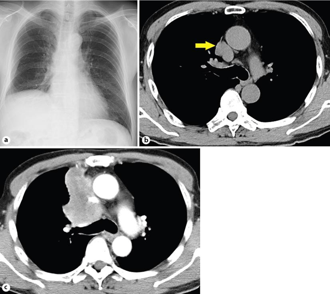

a chest radiograph showing a mass in the right upper lobe b ct scan showing a mass in the right upper lobe with a mass in the right upper lobe arrow and d ct scan showing a mass with a mass in the right upper lobe with a
chest radiograph taken in October 2011 revealed elevation of the right diaphragm a CT images revealed a small nodule localized on the right mediastinum adjacent to the pericardial cavity b The nodule had developed into a massive tumor in March 2012 c


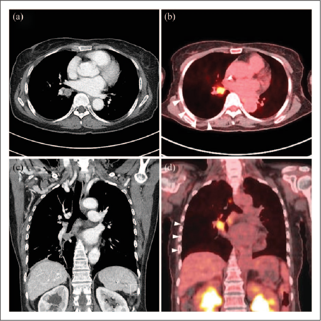

a ct scan of the chest showing a mass in the right breast b petct scan of the chest showing a mass in the right breast c petct scan of the chest showing a mass in the right breast d pet positron emission tomography
a  chest CT displaying an endobronchial mass entirely occupying the right lower lobar bronchus b PETCT revealing a hypermetabolic nodule in the right lower lobar bronchus and diffuse hypometabolism arrowheads of the right lower lobe lung c Coronal chest CT showing that the right lower lobar bronchus was obstructed by an endobronchial mass d Coronal PETCT showing that a hypermetabolic mass obstructs the right lower lobar bronchus and lobar hypometabolism arrowheads CT computed tomography PET positron emission tomography


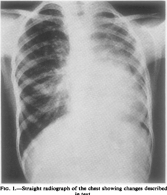

fig istraight radiograph of the chest showing changes described as a small nodule with a small amount of pleural effusion
FIG IStraight radiograph of the chest showing changes described in text


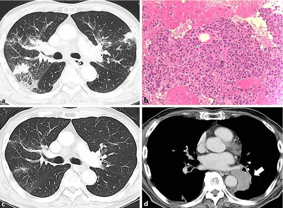

a ct scan of the chest showing a mass in the right upper lobe b ct scan of the chest showing a mass in the right upper lobe with a mass in the right upper lobe with a mass in the right upper lobe with a mass measuring 29
Initial chest computed tomography CT and microscopic findings of lung cancer and the chest CT findings after 2 and 5 months of alectinib a Multiple masses and nodules are seen in both lungs The lesions were diagnosed as ALKpositive lung adenocarcinoma b The lung cancer specimen shows an alveolar or sheetlike structure c After 2 months of alectinib administration all lesions are markedly improved d After 5 months of alectinib administration the lesions in the left lower lobe of the lung show regrowth arrow


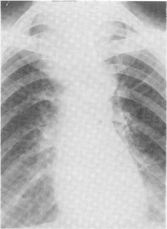

fig 1 portable chest radiograph showing a large mass in the right upper lobe with a small amount of calcification in the right upper lobe
FIG 2Case 2 Xray of chest


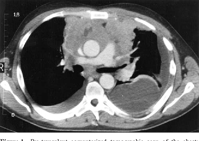

pretransplant computed tomography scan of the chest showing a mass in the right upper lobe with a mass in the right upper lobe
Pretransplant computerized tomographic scan of the chest taken 15cm below level of the carina confirming a 13cm anterior mediastinal mass with extension into hilar and subcarinal regions as well as bilateral pleural effusions


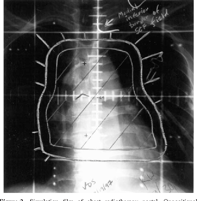

simulation film of chest radiography portal coronary angiography showing the presence of a large leftsided superior vena cava with a large right ventricle and a large right ventricle with a large right ventricle and a large
Simulation film of chest radiotherapy portal Oppositional APPA fields treated all residual mediastinal disease as determined by computerized tomography with tight 1cm margins extending from the top of T3 to the midportion of T9


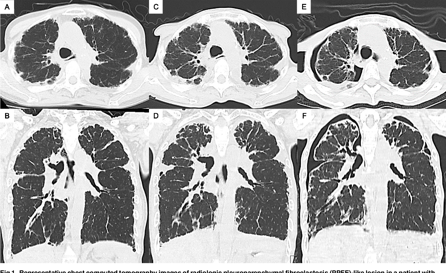

representative chest computed tomography images of multiple pulmonary pulmonary fibrosis and interstitial fibrosis in the lung a and a and b and c and d and d and d and d and d and d and d and d and d and
Representative chest computed tomography images of radiologic pleuroparenchymal fibroelastosis PPFElike lesion in a patient with systemic sclerosis and secondary Sjögren’s syndrome Images of patient 18 in S1 Table  and  At the time of diagnosis of interstitial lung disease  and  One year after the diagnosis  and  Two years after the diagnosis Chronologically the upper lobe PPFElike lesion increased the lung volume particularly at the upper lobes seemed to have decreased Finally the complication of bilateral upper lobe pneumothorax was found on the background of an emaciated body


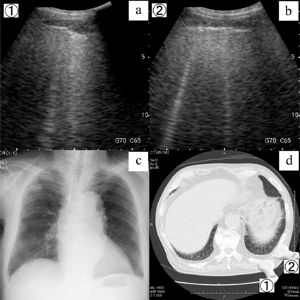

a chest radiograph showing a mass in the right upper lobe b computed tomography of the chest showing a mass in the right upper lobe c computed tomography of the chest showing a mass in the right upper lobe d computed tomography of the chest
Images obtained in hospital after a 10day admission a ultrasound image of position ① showing decreased pleural effusion and lower number of Blines compared with initial images in a b ultrasound image of position ② showing an almost normal lung with few compact Blines c chest Xray showing disappearance of opacity in bibasilar lung infiltrates and d chest CT scan showing improvement in bibasilar consolidation in the lung base with decreased pleural effusion in the left lung


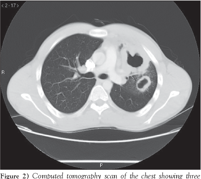

computed tomography scan of the chest showing three pulmonary nodules in the right upper lobe
Computed tomography scan of the chest showing three thickwalled cavitated injuries in the left lower lobe of the lung


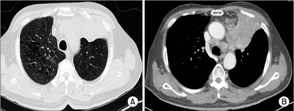

chest computed tomography ct scan showing a mass in the right upper lobe with a masslike appearance in the right upper lobe and a masslike appearance in the right lower lobe
Contrast enhanced computed tomography of the chest revealed 7×5cmsized mass in the left upper lobe with probable invasion of the main pulmonary arterial trunk and pericardium


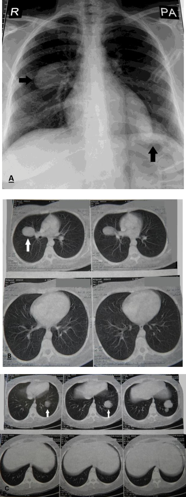

a poster of the chest xray showing a mass arrow in the right upper lobe b ct scan of the chest showing a mass arrow in the right upper lobe c ct scan of the chest showing a mass arrow in the right upper lobe
Bilateral intact cystic lesions on chest  ray  and CT scan    arrows


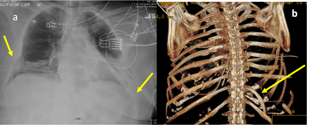

a 3d reconstruction of the chest and b 3d reconstruction of the chest and abdomen showing the structure of the right hemidiaphragm arrows
a Chest Xray demonstrating severe chest wall deforming Arrows and early pulmonary contusions b 3D reconstruction of chest showing severe deformity on the right with significant angulation of rib 11 Arrow and flail segment on the left


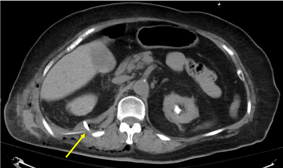

computed tomography of the chest showing a mass in the right upper lobe with a mass arrow in the right upper lobe
Axial CT scan of the chest showing severe angulation of rib 11 piercing through the right lower lung lobe into the retroperitoneum Arrow


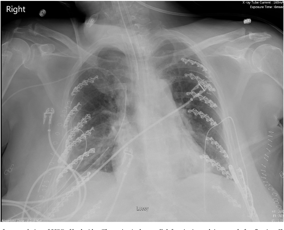

the chest xray showed a large mass in the right upper lobe with a small amount of peribronchial and hilar areas of calcification
Chest Xray after completion of SSRF of both sides The patients chest wall deformity is much improved after fixation She received a total of 18 new titanium rib plates


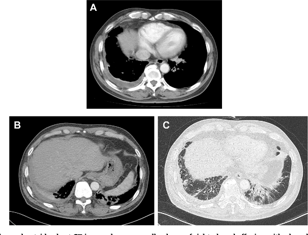

initial chest computed tomography showing a mass in the right lower lobe with a masslike appearance in the right lower lobe and multiple nodules in the right lower lobe with a maximum diameter of 5 mm and a maximum diameter of the mass with a maximum
e  Enhanced outsidechest CT image shows a small volume of right pleural effusion with pleural enhancement   Followup enhanced axial CT findings revealed a decrease in the volume of right pleural effusion relative to the observed in the outsidechest CT image  Bronchiectasis with bronchial wall thickening and mucoid impaction are observed in the both lower lobes There were peribronchial and subpleural consolidations in the both lower lobes


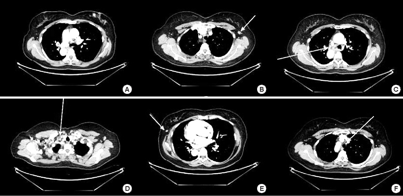

axial and coronal images of the chest and abdomen from a patient with a previous diagnosis of a metastatic lesion in the right lower lobe and b and c and d and d and d with a metastatic lesion in the right lower lobe
Radiologic findings for chest computed tomography CT CT scan shows the primary breast cancer of the left breast  and multiple lymphadenopathies of the left axilla  mediastinum   right axilla  and paratrachea  Arrows indicate enlarged lymph nodes and mass


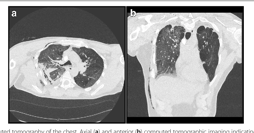

a computed tomography of the chest axial a and anterior b computed tomographic imaging indicating bilateral pulmonary nodules with cavitation and groundglass opacities
Preoperative computed tomography of the chest Axial a and anterior b computed tomographic imaging indicating pulmonary contusion


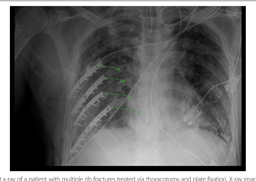

a chest xray of a patient with multiple rib fractures treated via thoracotomy and plate fixation xray images of a patient with multiple rib fractures and plate fractures
Postoperative chest xray of a patient with multiple rib fractures treated via thoracotomy and plate fixation Xray image displays the correct placement of the reconstruction plates and cortical locking screws on ribs 7–10


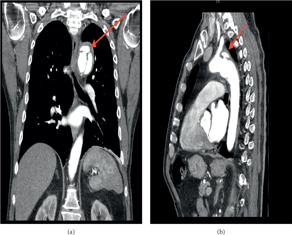

a and b contrastenhanced computed tomography of the chest showing a large mass in the right upper lobe of the lung with a mass in the right upper lobe arrow and a small mass in the right upper lobe of the lung with a mass
CT chest Both a coronal and b sagittal views as indicated by red arrows showed type  aortic dissection with mycotic aneurysm


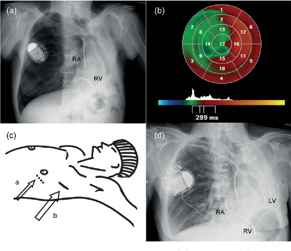

a chest radiograph showing a large right paratracheal mass b anteroposterior chest radiograph showing a large right paratracheal mass c anteroposterior chest radiograph showing a large right paratracheal mass
a Chest Xray showing an extreme leftward displacement of the heart right atrial RA and right ventricular RV—shock lead connected to the internal cardiac defibrillatorCRT in the right infraclavicular region b LV dyssynchrony analysis from an RT3DE data set using parametric images The global time to minimum systolic volume is used as timing reference early segments are coded in blue whereas late segments are coded in red c a conventional site for incision and b actual skin incision based on ultrasound guidance d Postoperative chest Xray with the LVlead tunnelled around the xyphoid processus


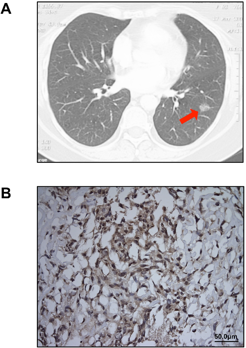

a highresolution computed tomography of the chest showing a masslike lesion in the right upper lobe b highresolution computed tomography of the chest showing a masslike lesion with a masslike appearance in the right upper lobe
Clinical diagnosis of lung adenocarcinoma and MPM   2 cm groundglass opacity arrow later diagnosed as lung adenocarcinoma was identified in the patient’s left lower lobe on chest CT scan No pleural thickening or implants were noted on preoperative imaging  Immunohistochemical staining for calretinin confirmed the diagnosis of MPM original magnification 20X


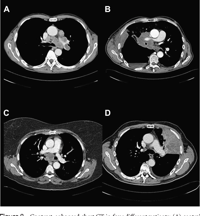

contrastenhanced chest ct in a 56yearold man with a history of a pulmonary fibrosis and a history of a chest wall mass with a fibrosis and a fibrosis in the right lower lobe a and a fibro
Contrastenhanced chest CT in four different patients  central involvement by lymph node with possible extracapsular extension indicated by asymmetric thickening of the lymph nodes’ cortex and the mediastinal fat invasion  contact 180 of the tumor and a proximal pulmonary artery


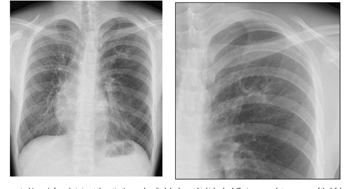

chest xrays of the patient showing bilateral pleural effusions and bilateral pleural effusions
chest Xray acquired 1 year before admission at the patients annual medical checkup at his high school The image reveals transparency of the left lung and deviation of the mediastinum  cavity is also visible in the left upper lung field


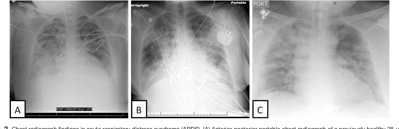

chest radiograph findings in a oneyearold boy with a primary respiratory failure and a small amount of peribronchovascular effusion on chest radiograph a posteroanterior view of the chest radiograph shows a large amount
FIG 2 Chest radiograph findings in acute respiratory distress syndrome ARDS  Anteriorposterior portable chest radiograph of a previously healthy 28yearold woman with severe ARDS due to aspiration  Anteriorposterior chest radiograph of a 62yearold woman with moderate ARDS due to bacterial pneumonia  Anteriorposterior chest radiograph of a 52yearold man with moderate ARDS due to influenzarelated pneumonia


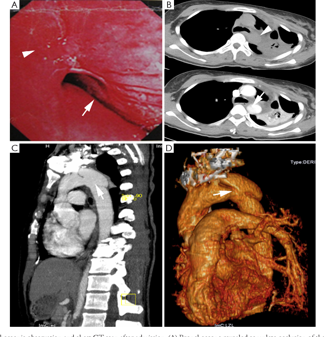

preoperative chest ct and volumetric data of the right pulmonary artery and the right pulmonary artery arrow and the right pulmonary artery arrow and the right pulmonary artery arrow and the right pulmonary artery arrow and the right pulmonary artery arrow and the right pulmonary artery
Bronchoscopic observation and chest CT scan after admission  Bronchoscope revealed complete occlusion of the left upper lobar orifice arrowhead and linestenosis of lower lobe bronchus arrow  chest CT showed normalshaped aorta arrowhead but suspicious dissection with contrast arrow CD descending aortic pseudoaneurysm was confirmed with CTA arrow CTA CT angiography


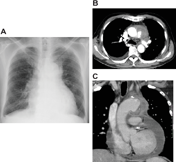

chest radiograph and computed tomography ct scan of the chest showing a mass in the right upper lobe with a mass in the right upper lobe with a mass in the right upper lobe and a mass with a mass in the right upper lobe with a
On day 3 chest radiography revealed enlargement of the cardiac shadow cardiothoracic ratio of 58 and the protrusion of the left first arch  On day 3 contrastenhanced chest computed tomography revealed an ulcerlike projection along the lesser curvature of the aortic arch surrounded by a hematoma At this point a ruptured thoracic aortic aneurysm was suspected  Coronal view enhanced computed tomography revealed pericardial effusion c


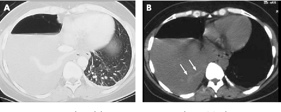

computed tomography of the chest showing a mass in the right upper lobe with a masslike appearance in the right upper lobe arrow and a masslike appearance in the right upper lobe arrow
Noncontrast enhanced chest CT scan at presentation showing  right haemopneumothorax in the lung parenchyma and  evidence of slightly hyperdense floating clots arrows within the pleural fluid


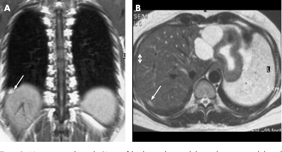

contrastenhanced computed tomography of the chest showing a mass in the right breast arrow and a mass in the right breast arrow
Noncontrast enhanced MRI scan of the chest and upper abdomen showing an ovalshaped welldefined lesion in the right posterior costodiaphragmatic recess abutting the pleura The lesion arrow exhibits homogeneous high signal intensity in  the coronal T1weighted spin echo image and  the axial T2weighted fast spin echo images without fat suppression


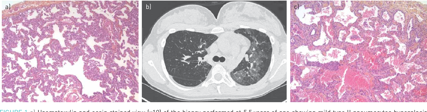

a computed tomography of the chest obtained on the basis of a pulmonary adenocarcinoma of a 56yearold man b computed tomography of a 58yearold man showing a mass with a cavity in the right upper lobe with a cavity
FIGURE 1 a Haematoxylin and eosin stained view x10 of the biopsy performed at 55 years of age showing mild type II pneumocytes hyperplasia diffuse septal thickening with rigid septa but without fibrosis and few intraalveolar macrophages without pulmonary alveolar proteinosis b Highresolution computer tomography of the chest at 26 years of age revealing a diffuse parenchymal lung disease with groundglass opacities c Haematoxylin and eosin stained view x10 of the biopsy performed at 26 years of age showing a similar appearance with mild type II pneumocytes hyperplasia and diffuse septal thickening with rigid septa superimposed with fibrosis


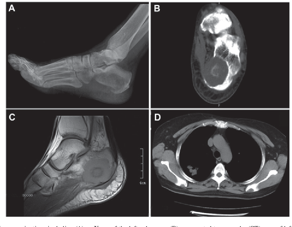

preoperative chest computed tomography ct scan shows a large mass in the right lower lobe with a heterogeneous enhancement in the right lower lobe and the mass is a large mass with a heterogeneous enhancement in the right lower lobe
Medical imaging examinations including  an ‑ray of the left calcaneus  a computed tomography CT scan of left calcaneus  a sagittal MR T1‑weighted image of the left calcaneus and  chest CT scans of the patient MR magnetic resonance


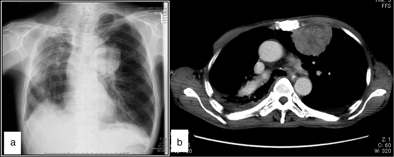

a chest radiograph showing a mass in the right upper lobe with a masslike appearance in the right lower lobe b computed tomography of the chest showing a mass with a mass in the right upper lobe with a mass measuring up to the right upper
a Chest radiograph showed a large mass in the left upper lung b chest computed tomography revealed a circumscribed 6 cm tumor in the left upper lobe


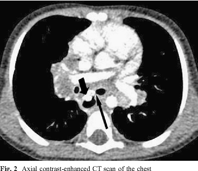

axial contrastenhanced ct scan of the chest showing a mass in the right upper lobe of the right lung with a mass in the right upper lobe of the lung
Axial contrastenhanced CT scan of the chest


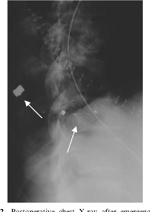

postoperative chest xray after emergency surgery showing a large mass with an irregular margin and an irregular margin in the right upper lobe arrow
Postoperative chest Xray after emergency thoracotomy with the retained bullet and bullet fragments


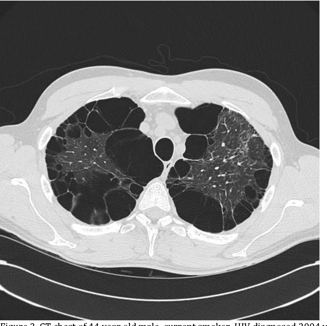

ct of the chest of a 44yearold female who presented with increased mycobacterium avium complex mycobacterium avium complex mac infection and presented with a malignant mesothelioma and a malignant meso
CT chest of 44 year old male current smoker HIV diagnosed 2004 with PCP infection Started cART 2009 poor compliance CD4 170 cellsμl VL 100000 copiesml


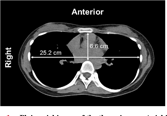

the chest computed tomography angiography demonstrates an anterior mediastinal mass measuring about the anterior mediastinum and the anterior mediastinum measuring about the anterior mediastinal mass measuring about the anterior mediastinal mass measuring approximately 3 cm
Plain axial image of the thoracic cage Axial image showing thoracic cage compression observed as a shortening of the anteroposterior diameter of the chest The ratio of transversetoanteroposterior diameter is 382


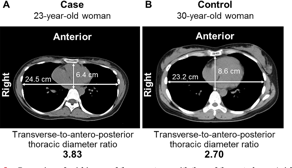

comparison of the images of the case of the case of the case of the case of the case of the case of the case of the case of the case of the case of the case of the case of the case of the case of the case
Comparison of axial images of the present case with those of the control case Axial images at the level of the ninth thoracic vertebra showing a more flattened chest in the present case  than that in the control case


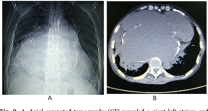

axial computed tomography ct revealed a giant left atrium and a large right atrium with a large right ventricle and a small right ventricle with a small right ventricle and a small right ventricle with a small right ventric
Axial computed tomography CT revealed a giant left atrium and calcification of the wall  Frontal chest radiograph of the patient with giant left atrium The cardiothoracic ratio was almost 09


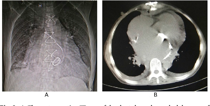

the chest xray and the chest wall reconstruction of the patient
The postoperative CT scan of the chest showed a marked decrease of left atrium  Postoperative frontal chest radiograph of the patient showed a marked reduction in the cardiothoracic ratio


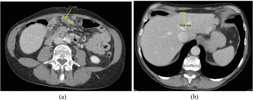

a and b contrastenhanced ct of the chest showing a mass in the right breast arrow and a mass in the right breast arrow
CT scan of the chest including part of the superior abdomen performed to complete staging after 2 weeks from the first CT scan


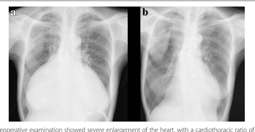

a preoperative examination showed severe enlargement of the heart with a cardiomegaly ratio of 07 b postoperative chest radiograph showed a moderate right pleural effusion and a moderate right pleural effusion
a Chest Xray at preoperative examination showed severe enlargement of the heart with a cardiothoracic ratio of 88 b Postoperative chest  ray showed reduced rightside shadow of the cardiac silhouette


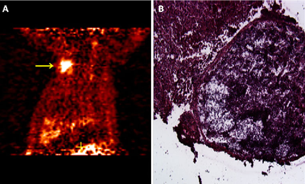

figure 1 a positron emission tomographycomputed tomographycomputed tomographycomputed tomographycomputed tomographycomputed tomographycomputed tomographycomputed tomographycomputed tomographycomputed tomographycomputed tomography
PET scan imagine and pathological results a Suspicious right chest wall mass The high radiotracer uptake seen in this PET scan study correlated with the high TBR detected with the intraoperative probes TBR of 110 and 824 were detected for gamma and beta probes respectively b HE staining of the lesion shows mesothelioma


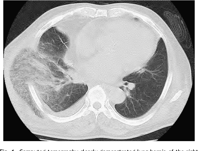

computed tomography clearly demonstrated lung cancer of the right lower lobe with a small amount of pleural effusion
Computed tomography clearly demonstrated lung hernia of the right lower lobe through a chest wall defect at the site of a previous thoracoscopic surgery At the previous thoracoscopic surgery intercostal incision was closed with two interrupted sutures passing over the rib above the incision and through the rib below the incision and three horizontal mattress interrupted sutures traversing the intercostal muscles above and below the incision


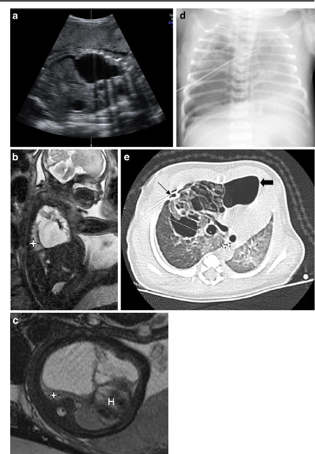

preoperative chest xray and ct scan showing a mass in the right lower lobe with a mass in the right lower lobe with a mass in the right lower lobe and a mass with a mass in the right lower lobe with a mass in the
Largecystic type congenital pulmonary airway malformation CPAM Sagittal US with the foetal head to the right a and balanced steadystate free precession MRI in the sagittal b and transverse c plane in week 31 of gestation show a large heterogenous lesion involving most of the right lung with macrocysts of varying size The affected lung is overexpanded causing inversion of the ipsilateral diaphragm compression of the right lower lobe star and the left lung and significant displacement of the heart  Neonatal chest radiograph d shows the increased volume of the multicystic right lung and secondary compression of the left lung The baby had severe respiratory distress at birth with spontaneous pneumothorax note right chest drain CT e performed on day 3 show a complex multicystic les

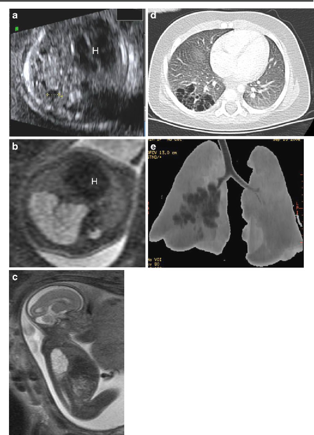

a and c and d sonography of the chest showing a mass lesion in the right lower lobe of the lung with a mass in the right upper lobe and a mass in the right lower lobe of the lung with a mass in the right lower
Smallcystic type congenital pulmonary airway malformation CPAM Transverse US of the foetal chest a at 21 weeks’ gestation shows a heterogenous mostly hyperechoic mass containing several small cysts within the right hemithorax There is secondary mild mediastinal shift  heart T2HASTE foetal MRI image at 21 weeks’ gestation in transverse b and sagittal c planes confirms the presence of multiple similarsized small cysts in the right lower lobe Postnatal chest CT performed at 3 months of age d and 3D reconstruction image Volume rendering presets Chest Transparent lung version 2006 Advantage Workstation General Electric Milwaukee WI USA e show the multiple pulmonary cysts and permit reevaluation of the extension of the lesion which now seems limited to the apical and posterobasal segme

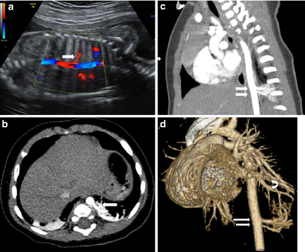

preoperative chest computed tomography ct and volumetry of the right hemithorax with contrastenhanced ct angiography and volumetry of the right hemithorax with contrastenhanced ct angiography and volumetry of the
Intralobar sequestration Coronal UScolor Doppler image a of the foetal chest at week 21 clearly demonstrates the abnormal arterial supply to the left lung base arrow arising from the distal thoracic aorta Because of these convincing findings foetal MRI was not performed Transverse b contrastenhanced chest CT at 3 months of age confirms the abnormal arterial vascular supply to the left posterobasal segment Sagittal c and surface rendering d reconstructions of the same CT data show that there are in fact two abnormal arteries white arrows with significant diameter compared to the aorta and show the venous drainage of the lesion via the pulmonary veins curved arrow


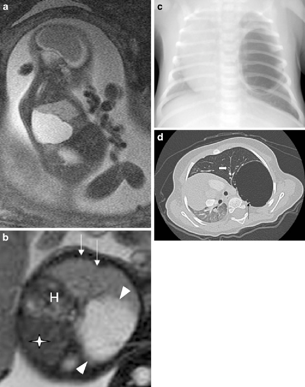

a chest radiograph showing a mass in the right hilum b ct scan of the chest showing a mass in the right hilum and d ct scan of the chest showing a mass in the right hilum and d ct scan of the chest showing
Hybrid lesion largecystic type congenital pulmonary airway malformation with dominant cyst and bronchial atresia Sagittal a and coronal b balanced steadystate free precession MRI at 27 weeks’ gestation show a large apparently solitary cystic lesion arrowheads within the left hemithorax The remaining left lung has high signal intensity white arrow compared with the normal right lung star a sign of retention of pulmonary fluid There is secondary mediastinal shift  heart Chest radiograph c at day 3 reveals the huge aerated left lung cyst Observe the severe mediastinal shift Contrastenhanced chest CT performed at 6 months of age d demonstrates additional tiny peripherally located cysts black arrow The main cyst is next to the airway causing obstruction of the segmental bronchus and dista

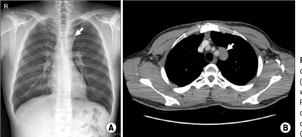

preoperative chest xray and ct scan of the chest showing a mass in the right upper lobe with a mass in the right upper lobe arrow and a mass in the right upper lobe with a mass in the right upper lobe with a mass in
Preoperative chest Xray and computed tomography CT images   35cm round shape mass was located above the aortic arch Preoperative chest Xray  3×2 cm large oval shaped mass located on the left paratracheal region Axial CT image white arrow


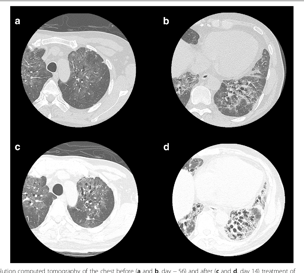

a highresolution computed tomography of the chest before a and b day c and d and d and d chest ct images of the patient with a and d and d and d and d and d
Highresolution computed tomography of the chest before a and b day − 56 and after c and d day 14 treatment of pneumocystis pneumonia


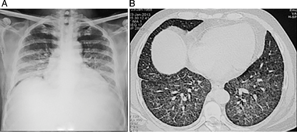

chest radiograph and highresolution computed tomography of the chest showing bilateral groundglass opacities with interlobular septal thickening and interlobular septal thickening
Frontal chest radiograph PA projection demonstrates haziness in bilateral mid and lower lung zones with illdefined tiny nodular opacities  High resolution computed tomography HRCT section of the lungs in the lower lobe region demonstrates multiple tiny perilymphatic and randomly distributed nodules


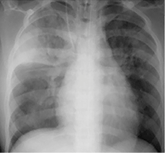

plain chest radiograph showing a mass in the right upper lobe with a small amount of pleural effusion
Frontal chest radiograph shows a large area of right upper lobe consolidation with air bronchograms which is limited inferiorly by the minor fissure Patchy consolidation is seen in the right lower lung zone and in the left upper and midlung zones in the perihilar region


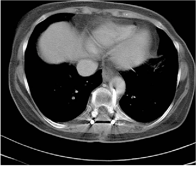

computed tomography of the chest showing a mass in the right upper lobe with a calcification in the right upper lobe
CT of the chest in axial planes at the level of T11 The left pedicle screw perforates the aorta with the implant spanning several millimeters into the lumen


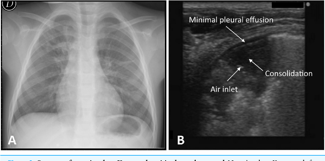

chest radiograph and chest computed tomography of the chest showing a large mass arrows in the right atrium and a small mass in the right atrium
One case of negative chest Xray and positive lung ultrasound Negative chest Xray result for a 4 year old female  and evidence of pneumonia in the posterior basal retrocardiac region of left lung by lung ultrasound


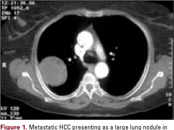

metastatic hcc presenting a large lung nodule in the right lower lobe of the lung with a mass in the right upper lobe and a mass in the right lower lobe of the lung with a mass located in the right lower lobe of the lung
Metastatic HCC presenting as a large lung nodule in the right lung contrast CT of the chest


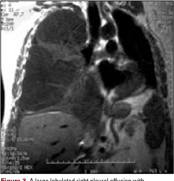

large lobulated right pleural effusion with heterogeneous enhancement in the right chest wall and mediastinal shift to the left
large lobulated right pleural effusion with heterogeneous soft tissue density at the pleural base consistent with a soft tissue mass with areas of low signal intensity on T2weighted images suggestive of areas of hemorrhage contrast MRI of the chest


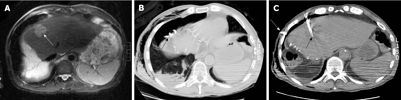

preoperative chest computed tomography ct scan shows a mass in the right lower lobe of the lung with a mass in the right lower lobe arrow and a mass in the right lower lobe of the lung with a mass in the right lower lobe of
Artificial pneumothorax for radiofrequency ablation of hepatic dome hepatocellular carcinoma in a 69yearold man  Axial T2WI magnetic resonance imaging shows  4 cm lesion arrow in the hepatic dome  Artificial pneumothorax was created after instillation of intrapleural air  chest tube was placed for drainage arrow  Intraprocedural computed tomography shows radiofrequency electrode within the lesion for a successful ablation black arrow


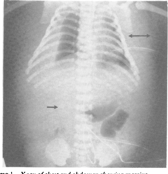

xray of chest and abdomen showing pneumonic emphysema with pneumomediastinum and pneumomediastinum arrows
FIG 1  ray of chest and abdomen showing massive oedema ofsubcutaneous tissues and calcification in the gall bladder


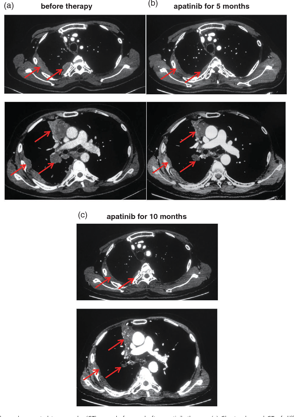

a and c and d computed tomography scans of the chest showing a mass in the right upper lobe of the lung with an area of lowdensity enhancement arrows and a mass in the right upper lobe of the lung with an area of lowden
Chest enhanced computed tomography CT scans before and after apatinib therapy a Chest enhanced CT of different layers taken before apatinib therapy revealed a soft tissue mass in the mediastinum and multiple metastases in the lymph nodes of the right hilar and mediastinal right pleura right intercostal muscle and right lung b After five months of apatinib treatment chest enhanced CT showed that the mediastinal mass and the metastatic lesions had become smaller compared to the baseline The patient achieved a partial response with a 31 reduction of the tumor c After 10 months of apatinib treatment the mediastinal mass and metastatic lesions reduced further and cavities formed To date a five month overall response and 10 months of PFS have been achieved


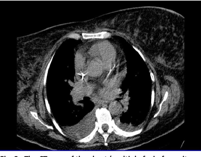

the ct scan of the chest showing a mass in the right upper lobe with a masslike appearance in the right upper lobe
The CT scan of the chest multiple foci of opacity disseminated in both lung fields bilateral pleural effusion


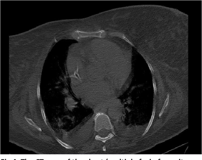

the computed tomography of the chest showing a mass in the right upper lobe with a calcification in the right upper lobe
The CT scan of the chest multiple foci of opacity disseminated in both lung fields


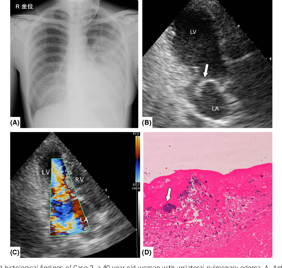

transthoracic echocardiography and imaging of case 2 a chest xray of a 57yearold man with unilateral pulmonary pulmonary malformation shows a mass in the left atrium and left atrium arrow b transthoracic echo
Imaging and histological findings of Case 2 a 40yearold woman with unilateral pulmonary edema  Anteroposterior chest radiograph shows leftside limited infiltrates without cardiomegaly  Transthoracic echocardiography shows mitral valve prolapse arrow  Color Doppler transthoracic echocardiography reveals mitral valve prolapse with severe regurgitation and the regurgitant jet tending to blow leftward within the left atrium  Histological findings reveal inflammatory cells and fibrin deposition in the mitral valve and vegetation with Grampositive cocci infiltration arrow LA left atrium LV left ventricle RV right ventricle


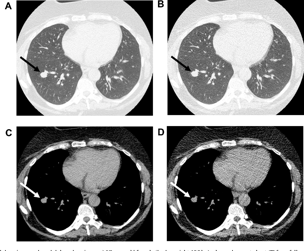

axial and coronal images of the chest showing a mass in the right upper lobe with a masslike appearance in the right upper lobe arrows and a mass with a masslike appearance in the right upper lobe arrows
a and c standard dose images b and d low dose images 57 yearold female body weight 120 kg who underwent chest CT for a followup of solitary pulmonary nodule in the right lower lobe The nodule appears as an oval smoothly marginated nodule on both standard dose CT image and low dose CT image arrow


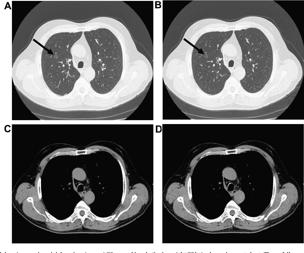

axial images of the chest showing a mass in the right upper lobe with a masslike appearance in the right lower lobe arrow and a mass measuring 7 × 8 cm in diameter with a masslike appearance in the right upper lobe with a mass measuring approximately
a and c standard dose images b and d low dose images 76 yearold male body weight 73 kg who underwent chest CT as a followup study for a groundglass pulmonary nodule  purely groundglass nodule in right upper lobe was clearly visualized both with standard dose CT and low dose CT arrow


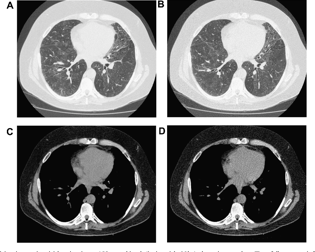

the chest computed tomography ct scan showed a mass in the right upper lobe with a masslike appearance in the right upper lobe and a mass in the right lower lobe with a masslike appearance in the right upper lobe with a mass with a mass
a and c standard dose images b and d low dose images 53 yearold male body weight 86 kg who underwent chest CT as a followup study for groundglass opacity in both lungs The difference in the lung parenchymal opacity can be recognized with a welldefined border between the groundglass area and the normalappearing area arrows


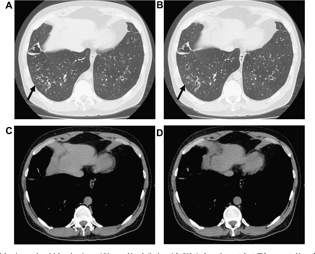

axial and coronal images of the chest showing bilateral groundglass opacities with a groundglass appearance and a groundglass appearance arrows in the right lower lobe
a and c standard dose images b and d low dose images 51 yearold male body weight 91 kg who underwent chest CT for suspected bronchiectasis and bronchial wall thickening Bronchiectasis bronchial wall thickening and centrilobular nodules are clearly visualized both with standard dose CT and low dose CT


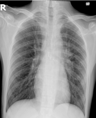

chest radiograph showing a mass in the right upper lobe with a small amount of pleural effusion
Followup chest Xray shows resolution of cavitary lesion and no consolidation Coils are seen in the mediastinum


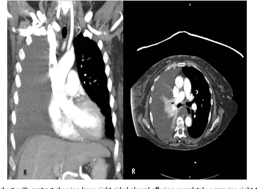

preoperative chest computed tomography with contrast showing large right pleural effusion involving the superior vena cava and the right hilar area
CT chest with contrast showing large rightsided pleural effusion completely occupying right thoracic cavity with complete collapse of the right lung


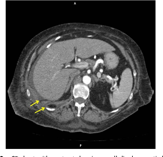

the chest computed tomography scan shows a large mass in the right breast with a low density in the right breast arrows the mass is located in the right breast and the mass is located in the right breast the mass is located in the right breast and
CT chest with contrast showing small diaphragmatic hernia containing fat on the right posterior aspect yellow arrows that resulted in the pleuroperitoneal leak


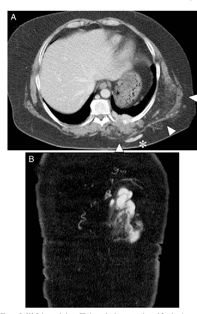

contrastenhanced ct of the chest showing a mass with an irregular margin and a heterogeneous enhancement in the right breast arrow and a mass with an irregular margin in the right breast arrow and a heterogeneous enhancement in the right
Enhanced chest CT showed a large muscle and fatdensity mass in the left back white arrowheads associated with large neoplastic vessels asterisk and the osteolytic change of the left eighth rib near the vertebra  Coronal section of enhanced chest CT revealed large neoplastic vessels running at her left back


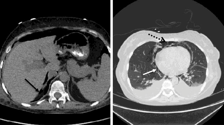

contrastenhanced ct of the chest showing a mass in the right upper lobe of the lung with a mass arrow in the right upper lobe arrow and a mass in the right lower lobe of the lung with a mass arrow in the right upper lobe
Computerized tomography of the abdomen left and chest showing pneumoperitoneum black arrow pneumomediastinum broken arrow and pneumopericardium white arrow


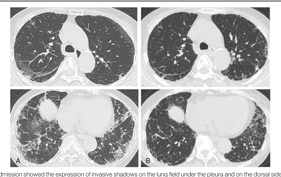

a and c standard dose images b and d low dose images d and d low dose images d and d low dose images d and d images d images d images d images d images d images d images d images d images d images d images d
chest CT on admission showed the expression of invasive shadows on  after the initiation of PE the invasive shadows showed improvement  CT


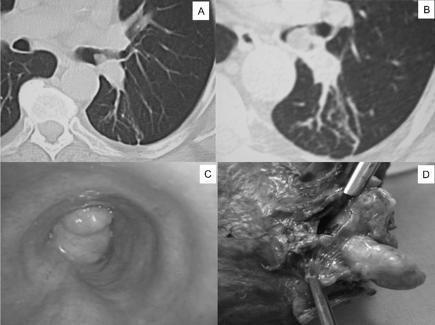

a and c standard dose images b and d low dose images d and d images of the chest ct images of the patient with a pulmonary mass in the right lower lobe of the lung with a small amount of pleural effusion with a
An endobronchial lesion can be observed in the left lower lobe at the level of the interlobar carina on the chest CT scan  Chest CT scan one year later growth of the endobronchial lesion towards the lumen of the main bronchus can be seen  Fibrobronchoscopy endobronchial lesion protruding towards and partially occluding the lumen of the main bronchus  Surgical specimen polypoid lesion originating from the lower lobe bronchus


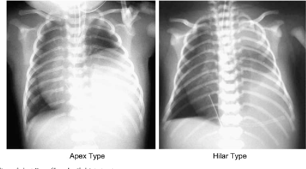

the chest xrays of the patient before and after the procedure
The findings of chest Xray films classified into two types


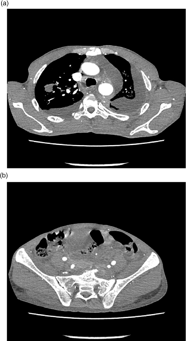

a computed tomography of the chest showing a mass in the right upper lobe with a masslike appearance in the right lower lobe b computed tomography of the chest showing a mass with a mass in the right upper lobe with a mass in the right
a Computed tomography scan of the chest with contrast showing bilateral effusion with pleural infiltration right upper lobe involvement soft tissue lesion in the posterior mediastinum b Computed tomography scan of the abdomen showing lytic lesions in pelvis and sacrum


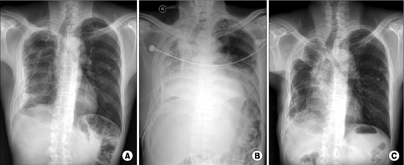

chest radiograph taken on admission showed a marked decrease in the size of the right hemithorax and bilateral pleural effusion chest radiograph taken on admission showed a marked decrease in the size of the right hemithorax and
Chest radiograph before operation showed empyema in the right pleural cavity  Postoperative chest radiograph  and recent chest radiograph


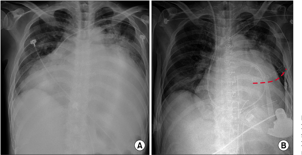

chest xrays showing a large mass in the right upper lobe with a small amount of peribronchial enhancement in the right upper lobe and right lower lobe red arrows
Preoperative chest Xray  Postright ventricular assist device implantation chest Xray Red dashed line left anterior minithoracotomy


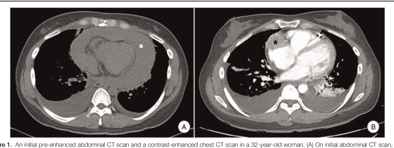

initial initial chest computed tomography ct scan a and b contrastenhanced ct scan a 32yearold woman on initial abdominal ct scan a the mass is located in the right atrium and left atrium arrowheads and the mass is located in the right
An initial preenhanced abdominal CT scan and a contrastenhanced chest CT scan in a 32yearold woman  On initial abdominal CT scan large amount of pericardial effusion is noted with preenhanced highattenuation 40 Hounsfield unit white asterisk and there are bilateral pleural effusions  On contrastenhanced chest CT scan after three days about 34cm sized a low density mass is noted in the right atrium black asterisk The amount of pericardial effusion is decreased with insertion of a drainage catheter


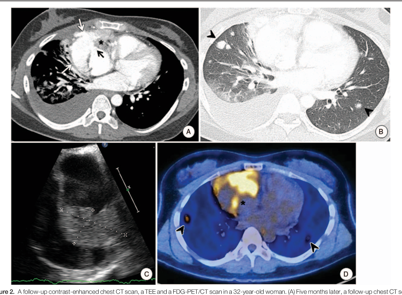

a initial chest computed tomography and b initial chest computed tomography and d initial chest ct scan showing a mass in the right lower lobe of the right lower lobe of the lung with a mass arrow and a small amount of pleural eff
followup contrastenhanced chest CT scan a TEE and a FDGPETC shows about 4cm sized a low density mass in the right atrium with invasion of atr extraluminal contrastfilled sac on the right paracardiac area white arrows whic moderate amount of right pleural effusion   lung window image shows multipl exam  On a TEE about 4cm sized a lobulated echogenic mass is identified standardized uptake values159 is seen in the cardiac mass of the right atrium


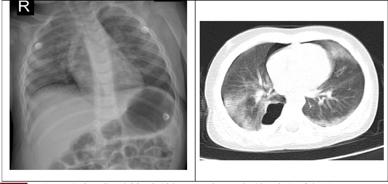

chest radiograph and computed tomography of the chest showing bilateral groundglass opacities with a groundglass appearance
Anterior posterior chest radiograph left and axial chest computed tomography right at the time of admission


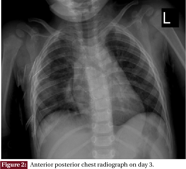

anteriorposterior chest radiograph on day 3
Anterior posterior chest radiograph on day 3


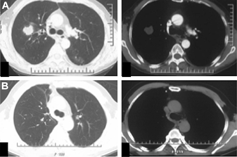

axial and coronal images of the chest showing a mass in the right upper lobe with a masslike appearance in the right upper lobe and a mass in the right lower lobe with a mass in the right lower lobe with a mass in the right upper
Computed tomography CT scans of the chest  CT scan before surgery tumorlike mass in the right upper lobe with blurred contour and irregular margin shown in the lung and mediastinal windows  The 7year followup CT scan after surgery


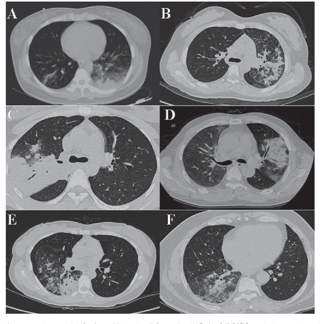

highresolution computed tomography of the chest showing bilateral groundglass opacities and groundglass opacities with a groundglass appearance and groundglass opacities with a groundglass appearance and groundglass appearance with a groundglass appearance and
High‑resolution computed tomography of patients with chest lung inflammation  Patient 3496397 Lungs had scattered ground‑glass opacities and small nodular opacities left lower lobe right side of the image revealed bronchial wall thickening and dilation  Patient 3590123 Left lung right side of image demonstrated multiple small nodules ground‑glass opacities and pulmonary consolidation was observed locally  Patient 3571267 right upper lobe demonstrated consolidation and ground‑glass density consolidation which was identified as BOOP  Patient 3614871 Left lung revealed multiple patchy opacities and BOOP  Patient 1333480 Right lung demonstrated multiple patchy blotchy consolidation ground‑glass opacity and small acinar nodules  Patie

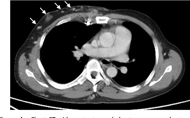

the chest ct showed a mass in the right upper lobe with a masslike appearance in the right lower lobe arrows the mass was larger than the left upper lobe
Chest CT with contrast revealed cutaneous vascular malformation in the right chest wall


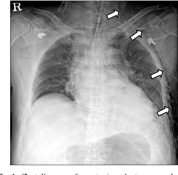

the chest xray reveals a mass in the right upper lobe with an irregular margin and a small amount of pericardial effusion arrows the mass is surrounded by a densely thickened wall of groundglass opacity with a thickened
Chest Xray revealing extensive subcutaneous emphysema around the chest wall and neck white arrows


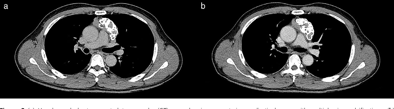

axial and coronal images of the chest showing a mass in the right lower lobe with a masslike appearance in the right lower lobe a and a mass with a masslike appearance in the right lower lobe b
a Unenhanced chest computed tomography CT scan showing an anterior mediastinal mass with multiple ring calcifications b Contrastenhanced chest CT scan obtained in the delayed phase showing mild enhancement of the soft tissue component extending into the pericardial fat tissue


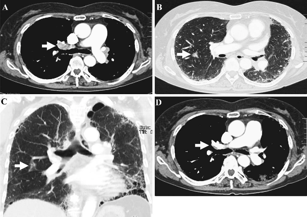

ct scans of the chest and abdomen showing a mass in the right upper lobe with a masslike appearance in the right lower lobe arrow and a mass with a masslike appearance in the right upper lobe arrow and a mass with a mass with a mass
Contrastenhanced chest computed tomography CT on admission AC  The mediastinal window revealed filing defects in the right upper and middle lobe pulmonary artery arrow  The lung window revealed a mass lesion of 1 cm in diameter in the right S2 segment arrow  Coronal images revealed a wedgeshaped consolidation originating from pulmonary artery above the horizontal fissure of the right lung arrow  Folowup CT after treatment showed considerable improvement arrow


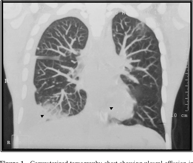

computerized tomography chest showing pleural effusion in the right upper lobe with a small amount of pleural effusion arrow
Computerized tomography chest showing pleural effusion in the right lung and pulmonary nodules in the left lung


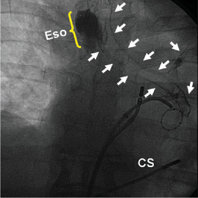

ecg in a 69yearold man with a history of chest pain and chest pain ecg in a 69yearold man with a history of chest pain and a history of chest pain and a history of chest pain ecg in a 69year
Aspiration of barium This inadvertent bronchogram arrows AP view was noted incidentally during the ablation procedure The patient remained asymptomatic during and after the ablation procedure and did not develop pyrexia  chest radiograph on the morning after the ablation procedure was normal The yellow bracket highlights the barium paste within the esophagus Also shown are the ablation catheter during energy delivery at the roof and the ring catheter in the left inferior PV


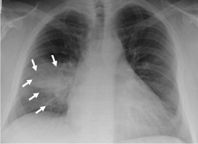

followup chest radiograph showing a mass in the right upper lobe with an irregular margin and a small amount of pericardial effusion arrows
chest radiograph PA from a patient who did not receive barium and subsequently developed fever on the morning after the ablation procedure The arrow points to an infiltrate in the right lower lobe which was likely due to aspiration The patient was prescribed oral antibiotics and he recovered uneventfully Followup imaging showed resolution of the infiltrate


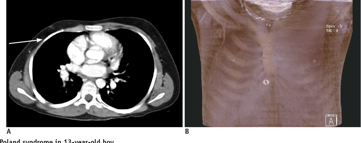

poland syndrome in a 53yearold boy with a history of chest pain and shortness of breath a ct scan of the chest shows a large mass with heterogeneous enhancement in the right breast arrow and a small mass with heterogeneous
Poland syndrome in 13yearold boy  CT and  MIP reconstruction images showing absence of pectoralis muscle in right chest wall arrow MIP  maximum intensity projection


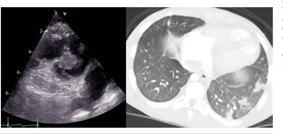

transthoracic echocardiogram of the chest showing a mass lesion in the right upper lobe with a masslike appearance in the right upper lobe arrow and a mass lesion in the right lower lobe with a mass lesion in the
Transthoracic echocardiogram demonstrating the largest mobile mass on pulmonary valve 20 × 12 mm and companion chest computed tomography showing subsequent pulmonary emboli


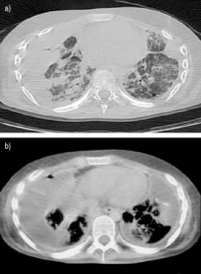

a computed tomography of the chest showing bilateral groundglass opacities with a groundglass appearance b computed tomography of the chest showing bilateral groundglass opacities with a groundglass appearance and a groundglass appearance
– Highresolution computed tomography of the chest at two different window settings a parenchymal and b soft tissue


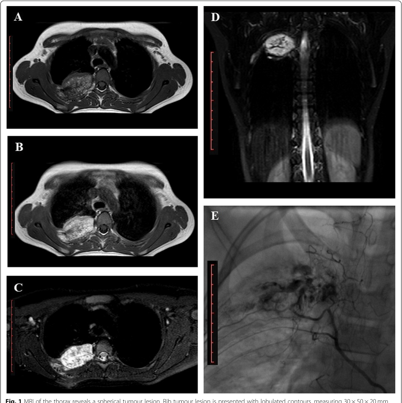

mri of the chest reveals a central mass in the right breast the mass is located within the right breast arrow the mass is located in the right breast and the mass is located in the right breast the mass is located in the right breast the mass is
MRI of the thorax reveals a spherical tumour lesion Rib tumour lesion is presented with lobulated contours measuring 30 × 50 × 20 mm located at the medial sector of the posterior arch of the fourth right rib and the adjacent chest wall at the level of the costovertebral junction  loss of normal bone structure is notable in the described sector a Heterogeneous lesion is slightly hyperintense dominantly isointense to muscle on FSE T1W images b Intravenous administration of paramagnetic contrast agent resulted in tumour enhancement on T1W images c On fatsuppressed T2W image a heterogeneous hyperintensity to muscle is obvious d On fatsuppressed T2W image two tubular structures 25 mm in size were seen arising from intercostal blood vessels adjacent 

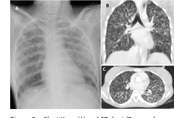

chest xray and ct findings in case 1 a chest xray shows groundglass opacities and groundglass opacities and a nodule in the right upper lobe b chest ct shows groundglass opacities and a groundglass opac
Chest Xray  and CT chest Bcoronal Caxial view showing miliary nodules involving both lungs


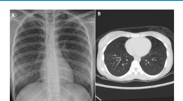

chest radiograph and computed tomography ct of the chest showing a mass in the right upper lobe with a masslike appearance in the right upper lobe
Followup chest Xray  and CT chest Baxial view after 3 months of antitubercular therapy showing complete resolution


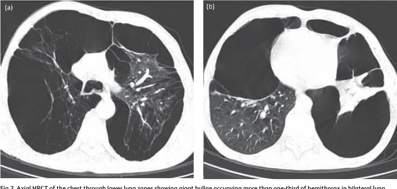

axial and coronal images from a noncontrasted chest ct of the chest showing a mass abutting the right upper lobe of pulmonary lung with a mass measuring approximately 25 × 25 cm in the right upper lobe
Axial HRCT of the chest through lower lung zones showing giant bullae occupying more than onethird of hemithorax in bilateral lung bases HRCT  high resolution chest computed tomography


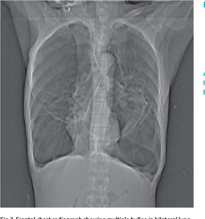

frontal chest radiograph showing multiple bullae in bilateral lung fields
Frontal chest radiograph showing multiple bullae in bilateral lung fi elds However the possibility of pneumothorax cannot be excluded


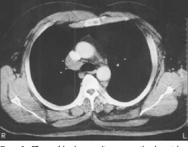

the ct scan of the chest showing a mass in the right upper lobe
CT scan of the chest revealing a mass with only partial enhancement located between the superior vena cava and the azygous vein


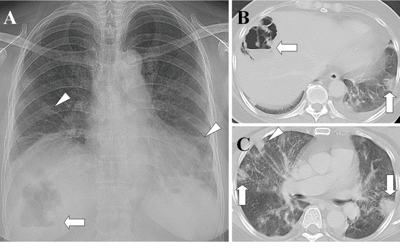

chest radiograph and highresolution computed tomography of the chest showing bilateral groundglass opacities arrows and a large mass arrow in the right upper lobe arrow and a small mass in the right lower lobe arrow and a small mass in the
Liver abscess with septic pulmonary emboli   chest radiograph shows an airfluid level in the right upper abdomen arrow and multiple nodular opacities in the bilateral lungs arrowheads   CT scan shows a gasforming liver abscess arrow and a peripheral wedgeshaped opacity abutting the adjacent pleura arrow   lung window of a crosssectional CT scan shows two peripheral wedgeshaped opacities abutting the adjacent pleura arrows and a peripheral nodule with a feeding vessel arrowhead The patient was a 61yearold diabetic woman whose blood and aspirate abscess cultures were positive for Klebsiella pneumoniae


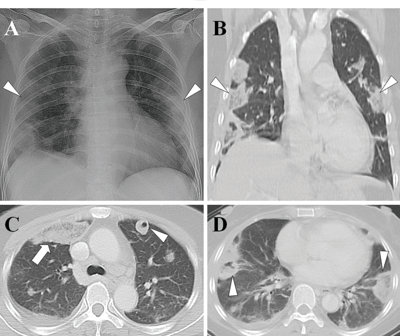

chest radiograph and highresolution computed tomography ct of the chest showing a mass lesion in the right upper lobe arrowheads and a mass in the right upper lobe arrowheads with a mass lesion arrowhead in the right upper lobe
Tricuspid valve infective endocarditis with septic pulmonary emboli   chest radiograph shows multiple peripheral patchy opacities in the bilateral lungs arrowheads   lung window of a coronal CT scan shows multiple peripheral wedgeshaped opacities arrowheads   lung window of a crosssectional CT scan shows a groundglass opacity in the right upper lobe arrow and a nodule with cavity in the left upper lobe arrowhead   peripheral wedgeshaped opacity with central necrosis in the right lower lobe arrowhead and a peripheral wedgeshaped opacity without central necrosis in the left lower lobe arrowhead The patient was a 50yearold woman whose blood cultures were positive for methicillinsusceptible Staphylococcus aureus


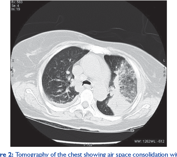

tomography of the chest showing air space consolidation with groundglass opacities and groundglass opacities
Tomography of the chest showing air space consolidation with multiple nodules in the left upper and middle lobe


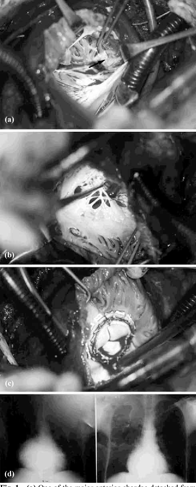

a the proximal and the proximal fibrin fibrin fibrin fibrin fibrin fibrin fibrin fibrin fibrin fibrin fibrin fibrin fibrin
a One of the major anterior chordae detached from its papillary muscle head b The arrow shows a fibrotic and scarred myocardial tissue on the anterior endocardial wall of the right ventricle under the anterior leaflet of the tricuspid valve c The valve was replaced with a bioprosthesis d The heart was reduced in size on the postoperative chest Xray taken two months later left corner preoperative right corner postoperative


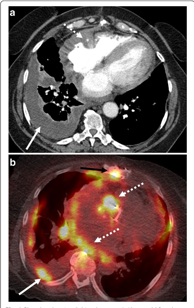

a and b contrastenhanced ct of the chest showing a mass with an irregular margin and heterogeneous enhancement in the right breast arrow and a mass with an irregular margin and a heterogeneous enhancement in the right breast arrow and
Pleural and pericardial involvement  62yearold female presenting with chest pain and shortness of breath a Contrastenhanced axial CT image demonstrates a partially loculated right pleural effusion solid arrow and masslike thickening of the pericardium extending into the epicardial fat encasing the right coronary artery dashed arrow b Fused axial PETCT demonstrates associated hypermetabolic uptake within the pericardial mass white dashed arrows and better depicts multifocal rightsided pleural involvement white solid arrow There is also sternal involvement black solid arrow


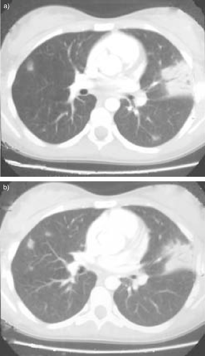

figure 1 a highresolution computed tomography ct of the chest showing a mass lesion in the right upper lobe b highresolution ct of the chest showing a mass lesion in the right upper lobe
FIGURE 2 Two windows of the same chest computed tomography scan obtained on October 31 2003 day 21 from onset


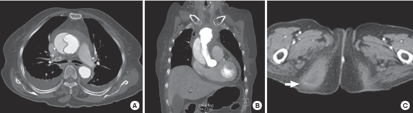

preoperative chest computed tomography ct scan shows a mass in the right lower lobe of the lung with a masslike appearance in the right lower lobe of the lung and the mass is larger than in the left lower lobe of the lung
Enhanced chest CT scans with axial  and coronal images  show the dissection flap of the ascending aorta with pericardial effusion and wall thickening of the proximal aortic arch which may be suggested a soft tissue infection or hematoma Mediastinal fluid collection and bilateral pleural effusion are also noted  Abscess on the right buttock white arrow was found incidentally at CT scans


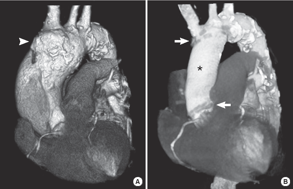

preoperative chest computed tomography ct shows a large mass with heterogeneous enhancement in the right paratracheal area arrowheads and a large mass with heterogeneous enhancement in the right paratracheal area arrowheads and
Preoperative  and postoperative  threedimensional volume rendering of contrastenhanced CT scans  Preoperative CT scans show Stanford type  aortic dissection with the enlarged ascending aorta and that the proximal aortic arch was aneurysmal and atherosclerous changes During surgery infectious aortitis was identified incidentally at the proximal aortic arch arrowhead  Postoperative chest CT scans revealed that the ascending aorta and hemiarch were replaced with a prosthetic graft asterisk and patent Also proximal and distal anastomotic lines arrow were visible


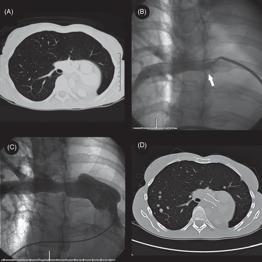

a ct scan of the chest showing a mass in the right upper lobe b ct scan of the chest showing a mass in the right upper lobe c ct scan of the chest showing a mass in the right upper lobe
Computed tomography CT pulmonary angiogram showing posterior displacement of the mediastinum and stenosis of right pulmonary artery  Pulmonary angiography demonstrating right pulmonary artery stenosis arrow  Pulmonary angiography post stent insertion  CT chest 12 months after pulmonary artery stenting showing evidence of widespread pulmonary nodules and the right pulmonary artery stent in situ


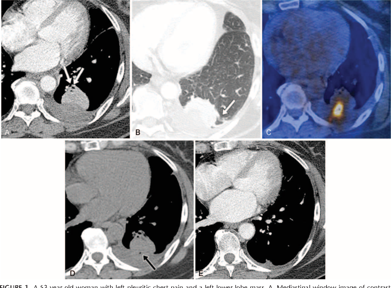

58yearold woman with left pleural mass and a welldefined mass in the mediastinum contrastenhanced computed tomography of chest shows a welldefined mass with heterogeneous enhancement in the right pleur
FIGURE 1  53yearold woman with left pleuritic chest pain and a left lower lobe mass  Mediastinal window image of contrastenhanced computed tomography CT shows a 55 cmsized welldefined pleuralbased mass appearing as a homogenous enhancement in the left lower lobe with accompanying pleural effusion Converging bronchovascular markings referred to as the ‘‘comettail’’ sign are noted at the proximal aspect of the mass arrows  On the lung window image of CT subsegmental atelectasis is noted toward the mass arrow  Positron emission tomographycomputed tomography scan reveals abnormally increased fluorodeoxyglucose uptake not only within the mass standardized uptake value max¼93 but also in the left pleura and pleural effusion standardized uptake value max¼27  Noncontrast CT scan obtained during 

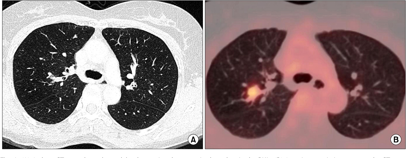

the chest ct scan showed a mass lesion in the right upper lobe with a small amount of pleural effusion the mass was surrounded by a masslike structure with a solid component in the right upper lobe the mass was surrounded by a
chest CT scan showed a nodule obstructing the posterior bronchus in the RUL   positron emission tomographyCT scan the standardized uptake value of the RUL nodule was 41 and it was presumed to be an endobronchial malignancy CT computed tomography RUL right upper lobe


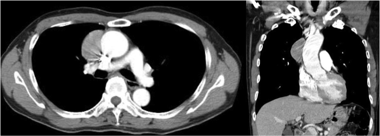

preoperative chest computed tomography showing a mass in the right lower lobe with a masslike appearance in the right lower lobe
Contrast computed tomography scan of the chest 47mm solid mass with a clear rim in the anterior mediastinum


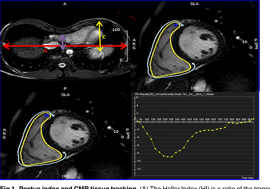

pectus index and cmr data in a noncontrast ct of the chest the haller index is a ratio of the tumor in the right breast the yellow dotted line is the breast mass the breast mass is the breast mass the breast mass
Pectus index and CMR tissue tracking  The Haller Index HI is a ratio of the transverse diameter of the chest line a to the distance between the posterior aspect of the sternum and the anterior portion of the vertebra line b HI  ab The correction index CI measures the depression of the sternum relative to the anterior chest CI  cbc x 100  Right ventricular longitudinal strain  and  Midcavity circumferential strain and peak value was recorded The yellow colored contours show the tracking of the ventricle


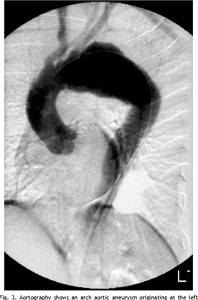

aortic angiography shows an arch aortic angiography originating at the left upper lobe of the left lung and a left lower lobe lesion with a large amount of pericardial effusion
Aortography shows an arch aortic aneurysm originating at the left subclavian artery The patient was involved in a high speed MVC one year earlier and presented with persistent back pain The aneurysm was diagnosed after chest Xray and plain films of her thoracic spine revealed a widened mediastinum Of note MRI and plain radiographs a few months prior to her MVC were normal


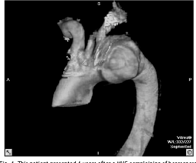

this initial magnetic resonance imaging of the chest shows a large mass with a low density in the right upper lobe of the right lung with a low density in the right upper lobe of the mass the mass is located in the right upper lobe of the mass
This patient presented 4 years after a MVC complaining of hoarseness dyspnea and odynophagia Chest Xray demonstrated a widened mediastinum The reconstructed CT angiogram of the chest shown here reveals a pseudoaneurysm of the aortic arch originating proximal to the left subclavian artery


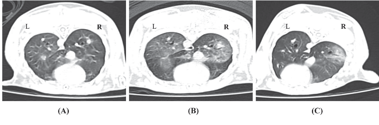

initial chest computed tomography ct findings at the time of admission the largest mass in the right lower lobe was approximately 22 cm and the largest mass was approximately 25 cm in the right lower lobe and the largest mass was approximately 25 cm in the largest mass
Lung inflammatory change by chest CT image analysis Both lungs were instilled with 10 µgml of P25 TiO2 in the right lung and normal saline in the left lung  normal lung at baseline  lung inflammation with ground glass opacity in both lung fields 1 h after instillation of P25 TiO2 NP  after 24 h of P25 TiO2 NP exposure ground glass opacities in the left lung control disappeared but they remained in the right lower lung field


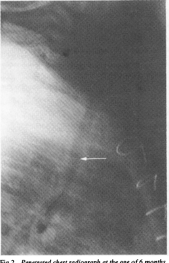

generalized chest radiograph of the area of a monthy chest radiograph of a patient with a pulmonary hypertension showing a large mass in the right upper lobe with a small amount of air in the right upper lobe and the right lower lobe
Penetrated chest radiograph at the age of 6 months showing no evidence of residual tracheal stenosis arrow marks site ofanastomosis


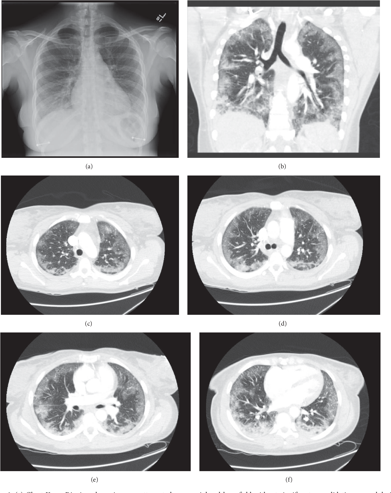

chest radiograph and highresolution computed tomography ct of the chest showing bilateral groundglass opacities and groundglass opacities with a groundglass appearance and a groundglass appearance with a groundglass appearance and a groundglass appearance with
a Chest Xray PA view shows increase attenuated over peripheral lung field without significant consolidation or nodularity b–f Computed tomography of chest shows extensive symmetric alveolar opacities with interspersed foci of interlobular septal thickening subpleural sparing and scattered groundglass nodularity over the bilaterally periphery lung field with perihilar sparing No mediastinal hilar lymphadenopathy or pleural effusion


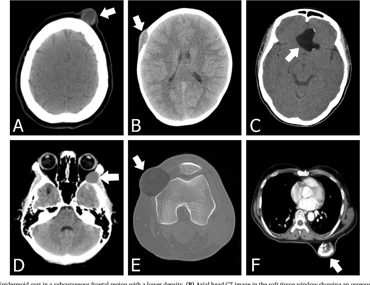

a and c contrastenhanced chest computed tomography ct scans show a mass with a lobulated margin in the right lower lobe with a lobulated margin and a heterogeneous enhancement in the right lower lobe with a hetero
Epidermoid cyst in a subcutaneous frontal region with a lower density  Axial head CT image in the soft tissue window showing an osseous destructive lesion in the right frontal calvarium with beveled edges and a soft tissue component Pathology proved epidermoid cyst in a 6yearold boy  Axial CT scan showing suprasellar epidermoid cyst with the calcified wall   bonedestroying epidermoid cyst with sclerotic borders is detected on the lateral wall of the left orbit on axial CT scan image The lesion mainly located on the greater wing of the sphenoid extends into the zygomatic bone temporalis fossa and orbit   40 yearold male with an epidermoid cyst in the left knee Axial CT image in the bone window reveals a mass with the homogeneous density of soft tissue extending into the femur 

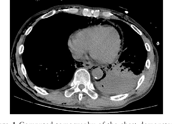

computed tomography of the chest demonstrating a mass in the right upper lobe with a calcification in the right upper lobe
Computed tomography of the chest demonstrating pneumomediastinum left pneumothorax and left pleural empyema


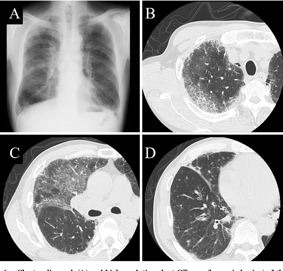

chest radiograph and highresolution computed tomography ct of the chest showing bilateral groundglass opacities and groundglass opacities with groundglass opacities and groundglass opacities with groundglass opacities and groundglass
Chest radiograph  and highresolution chest CT scan lung windowing of the right lobe of the lung BD in case 1


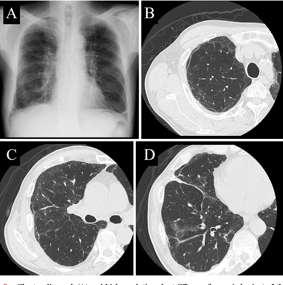

chest radiograph and highresolution computed tomography ct of the chest showing bilateral groundglass opacities and groundglass opacities with a groundglass appearance and a groundglass appearance with a groundglass appearance and a groundglass appearance with
Chest radiograph  and highresolution chest CT scan lung windowing of the right lobe BD after treatment in case 1


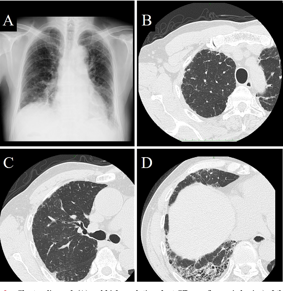

the chest radiograph and highresolution computed tomography ct scan of the chest showing bilateral groundglass opacities with groundglass opacities and groundglass opacities with groundglass opacities and groundglass opacities with
Chest radiograph  and highresolution chest CT scan lung windowing of the right lobe BD after treatment in case 2


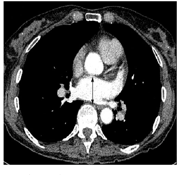

axial ct image of the chest showing a mass in the right upper lobe with a calcification in the right upper lobe arrow
Axial CT scan of the chest showing aneurysmal dilatation of the main pulmonary artery to 57 cm double arrowheads


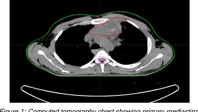

computed tomography chest showing primary mediastinal mass with a diameter of 5 cm in the right breast and mediastinal mass measuring 7 cm in the right breast
Computed tomography chest showing primary mediastinal seminoma with the involvement of major vessels


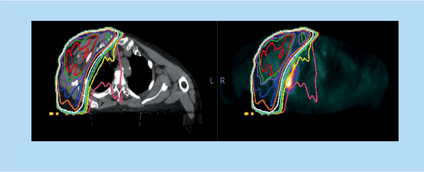

axial and sagittal images of the chest showing the mass in the right breast and the mass in the left breast with the mass located in the right breast the mass is located in the right breast the mass is located in the right breast the mass
Prior right lateral chest wall mass radiation dosimetry right and radiation field overlying the PETCT scan visualizing the radiation recall pneumonitis left


In [ ]:
from transformers import BlipForConditionalGeneration

model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-base")

load_path = "/content/drive/MyDrive/CSC490/CSC490_MONDAY_PREP/fine_tuned_model_graphed3.pth"
model.load_state_dict(torch.load(load_path))

model.eval()

model.to(device)

df = []
for i in range(0, 200):
  df.append(generate_caption(i, dataset))

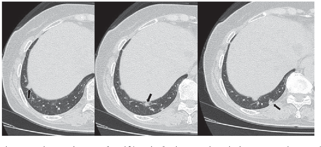

axial chest computed tomography images showing a mass in the right lower lobe with a masslike appearance in the right lower lobe arrow and a masslike appearance in the right lower lobe with a masslike appearance in the right lower lobe with a masslike
Follow‑up chest computed tomography scan performed 24 months after the surgery detected pulmonary metastatic tumors ≤15 mm in the right


In [ ]:
r = generate_caption(1, dataset)

In [ ]:
import pandas as pd
new_df = pd.DataFrame(df, columns=["generated_caption", "reference"])
new_df

,generated_caption,reference
0,followup chest radiograph showing a mass in th...,The chest Xray showed a curved tubular structu...
1,axial chest computed tomography images showing...,Follow‑up chest computed tomography scan perfo...
2,a and c standard dose images b and d low dose ...,Plain chest CT on admission showed right pleur...
3,preoperative chest xray showing bilateral pleu...,Preoperative chest Xray showing bilateral pleu...
4,chest radiograph and computed tomography of th...,chest radiograph and emergency CT of the cervi...
...,...,...
195,chest radiograph and highresolution computed t...,Chest radiograph and highresolution chest CT ...
196,the chest radiograph and highresolution comput...,Chest radiograph and highresolution chest CT ...
197,axial ct image of the chest showing a mass in ...,Axial CT scan of the chest showing aneurysmal ...
198,computed tomography chest showing primary medi...,Computed tomography chest showing primary medi...
